### Loading the super-tensor and creating the temporal networks

In this notebook we will explore the class __temporal_nets__ to compute preliminar results using network analysis.

In [1]:
# Adding GDa to path
import sys
sys.path.insert(1, '/home/vinicius/GrayData-Analysis')
# Importing the temporal network class
from   GDa.temporal_network              import temporal_network
from   GDa.graphics.plot_raster          import plot_nodes_raster_all_bands 
from   GDa.graphics.plot_coherence_dists import plot_pooled_coherence_dists, plot_pooled_coherence_dists_per_stage, plot_pooled_coherence_dists_per_stim
from   GDa.graphics.plot_adjacency       import plot_adjacency 
from   GDa.net.layerwise                 import *
from   GDa.net.null_models               import *
from   GDa.net.temporal                  import *
import numpy                 as     np
import networkx              as     nx
import matplotlib.pyplot     as     plt
import igraph                as     ig
import leidenalg
import scipy.signal
import time
from   tqdm                  import tqdm
from   joblib                import Parallel, delayed
from   scipy                 import stats

# Just an auxiliary function to sommoth plots
def smooth(x, w):
    return scipy.signal.fftconvolve(x, np.ones(w)/w, mode='same')
# Just an auxiliary function to compute z-score
def zscore(x):
    z = np.zeros_like(x)
    for i in range(len(z)):
        if x.std() == 0:
            continue
        else:
            z[i] = (x[i]-x.mean())/x.std()
    return z
# Bands names
bands = [r'$\theta$', r'$\alpha$', r'$\beta$', r'low-$\gamma$ ', r'high-$\gamma$' ]

To instantiate the __temporal_network__ we have to supply the monkey name, the session, and date to its constructor.

In [2]:
# Instantiating a temporal network object
net = temporal_network(raw_path = '../super_tensors/', monkey='lucy', session=1, date=150128, align_to = 'cue', 
                       trial_type = 1, behavioral_response = 1)

When instantiated, the temporal network object will load the recording info for the monkey, date, and sesion specified as well as the super tensor;

The super-tensor has dimensions [Number of pairs, Number of frequency bands, Number of trials * Time] (i.e., the trials are concatenated). So far we are using the following bands:

- $\theta$  = [4,7]  Hz;
- $\alpha$  = [8,14]  Hz;
- $\beta$   = [16,34]  Hz;
- low-$\gamma$  = [40,70]  Hz;
- high-$\gamma$  = [70,100]  Hz;

Band ranges from: https://doi.org/10.1016/j.neuron.2016.02.028 

It is possible to check which recording information was recordes by acessing the __session_info__ dictionary:

In [3]:
print('Recording info available:\n')
print(list(net.session_info.keys()))

Recording info available:

['areas', 'channels_labels', 'fsample', 'indch', 'indt', 'nC', 'nP', 'nT', 'pairs', 'stim', 't_cue_off', 't_cue_on', 't_match_on', 'tarray']


We can plot the super tensor to visualize the time series of link strength for each band (here we plot 10 trials for better visualization).

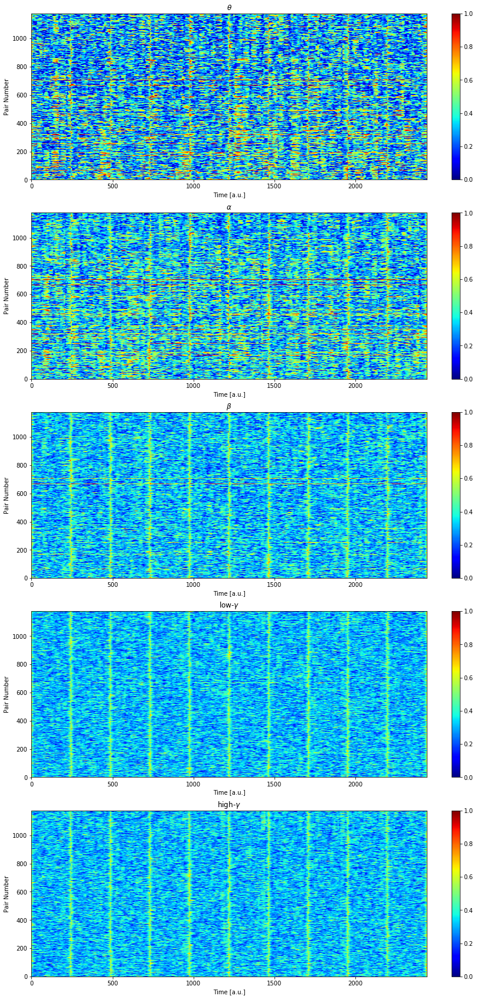

In [4]:
plt.figure(figsize=(15,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10*len(net.tarray)], aspect = 'auto', cmap = 'jet', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor_no_trim.png')

Notice that strong vertical stripes appear at the beggining/ending of each trial in the image above. This is due artifacts during wavelet estimation of pairwise coherences. To remove the border artifacts it is possible to instantiate the __temporal_network__ class specifing the parameter __trim_borders__ = True, and a value to the parameter __wt__. Doing that the firs and last __wt__ time points of the super tensor and the time array will be removed.

In [5]:
# Instantiating a temporal network object specifing trim_borders and wt.
net =  temporal_network(raw_path = '../super_tensors/', monkey='lucy', session=1, date=150128, align_to = 'cue', 
                       trial_type = 1, behavioral_response = 1, trim_borders=True, wt=(20,30))

Now let's plot the super tensor for the first ten trials again and observe that now the vertical stripes are gone.

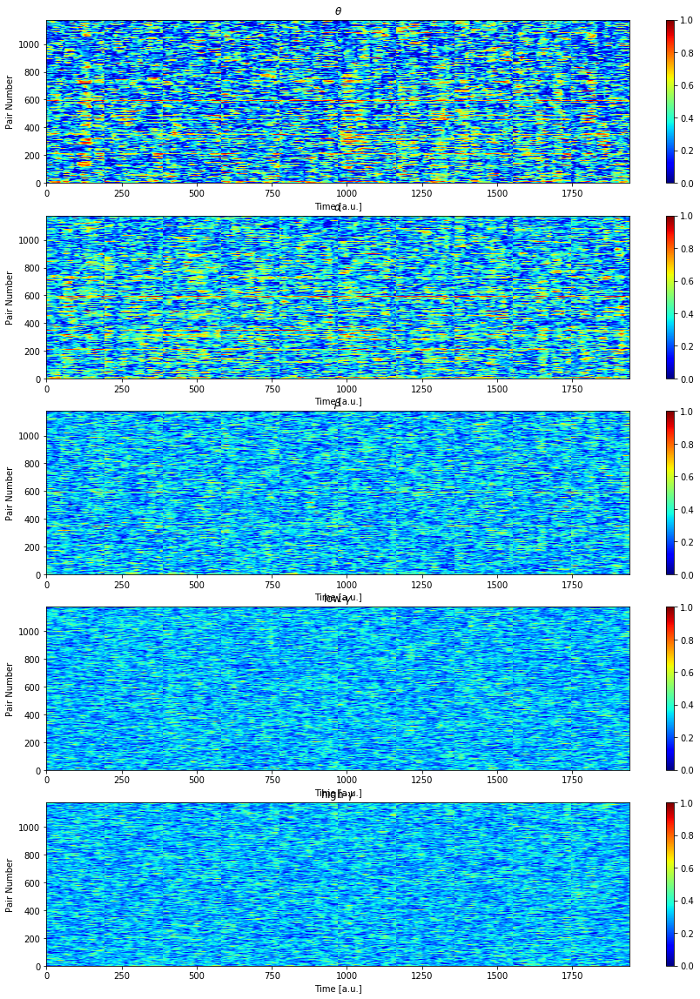

In [6]:
plt.figure(figsize=(15,20))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10*len(net.tarray)], aspect = 'auto', cmap = 'jet', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor.png')

Some of the network theory measures can be applied to the binarized version of the network and in order to do so it is necessary to define thresholds for the coherence values, this can be done with the method __compute_coherence_thresholds__, this method receives a parameter __q__ between $0$ and $1$ that specifies that only links with coherence values in the top $(1-q)$ of the distribution will be kept.

The __temporal_network__ class can also be instantiated by setting threshold as __True__ this will automatically threshold the super-tensor. In this case the parameter __relative__ should be set as __False__ in case a common threshold (for each frequency band) should be used for all the links or as __True__ if a threshold for each link (in each frequency band) should be used instead. The parameter __q__ is the quartile used to threshod the coherence values.

In [ ]:
# Instantiating a temporal network object without thresholding the data
net =  temporal_network(raw_path = '../super_tensors/', monkey='lucy', session=1, date=150128, 
                        align_to = 'cue', trial_type = 1, behavioral_response = 1, trim_borders=True, 
                        wt=(20,30), threshold=True, relative=True, q=.8)

Threshold in $\delta$ band = 0.5004674047231674
Threshold in $\alpha$ band = 0.48368224047124386
Threshold in $\beta$  band = 0.3963930446902911
Threshold in $\gamma$ band = 0.3766733191721141
Threshold in $\gamma$ band = 0.37561105037108067


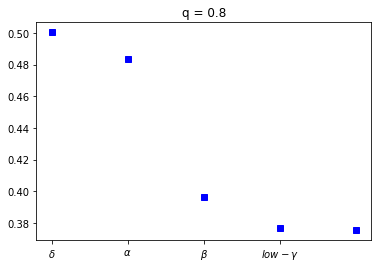

In [7]:
# Printing the threshold values 
print(r'Threshold in $\delta$ band = ' + str(net.coh_thr[0]))
print(r'Threshold in $\alpha$ band = ' + str(net.coh_thr[1]))
print(r'Threshold in $\beta$  band = ' + str(net.coh_thr[2]))
print(r'Threshold in $\gamma$ band = ' + str(net.coh_thr[3]))
print(r'Threshold in $\gamma$ band = ' + str(net.coh_thr[4]))

plt.plot(range(5), net.coh_thr, 'bs')
plt.xticks(range(4), [r'$\delta$', r'$\alpha$', r'$\beta$', r'$low-\gamma$', r'$high-\gamma$'])
plt.title('q = 0.8')
plt.savefig('../figures/layerwise_net/thresholds_q80.png')

To better visualize the threshold we can plot the pooled ditributions of coherence for each frequency band and indicate the threshold with a vertical line:

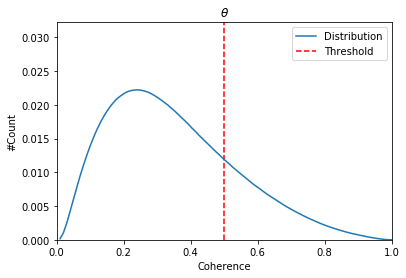

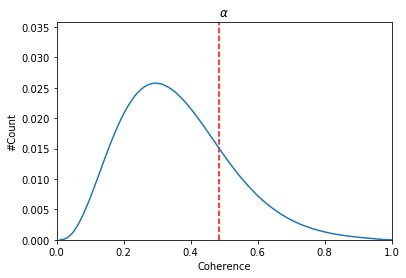

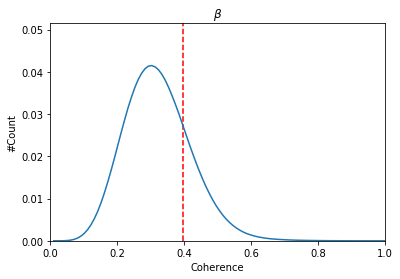

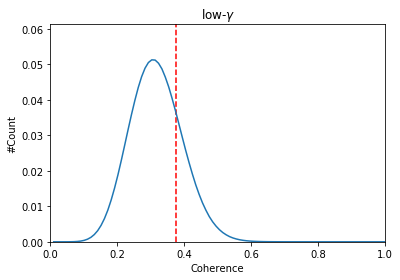

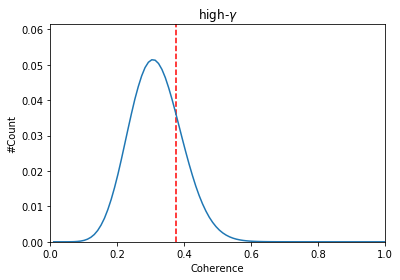

In [8]:
for i in range(len(bands)):
    plt.figure()
    n,x = np.histogram(net.super_tensor[:,i,:].flatten(order = 'C'), bins=np.linspace(0,1,100))
    n = n / n.sum()
    plt.ylabel('#Count')
    plt.xlabel('Coherence')
    plt.title(bands[i])
    plt.plot(x[1:], n)
    plt.xlim([0,1])
    plt.ylim([0, n.max() + 0.01])
    if type(net.coh_thr[i]) != type(None):
        plt.vlines(net.coh_thr[i], 0, n.max() + 0.01, linestyle = '--', color = 'r')
        if i == 0:
            plt.legend(['Distribution', 'Threshold'])
plt.savefig('../figures/layerwise_net/super_tensor_dists_thr.png')

Let's plot the binarized super tensor as well:

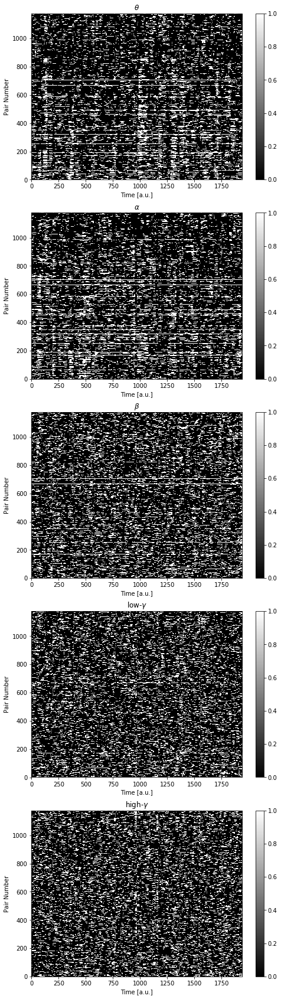

In [9]:
plt.figure(figsize=(8,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10*len(net.tarray)]>net.coh_thr[i], aspect = 'auto', cmap = 'gray', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor_thresholded.png')

To use the Python package networkx or igraph to compute network theory quantities it is necessary to instantiate a __Graph__ object, to do so we have to provide an adjacency matrix to the __Graph__ method. Note that the super tensor is the edge representation of the network, but we can convert it to an adjacency matrix by calling the methdo __convert_to_adjacency__ in the class __temporal_network__. This method will create the variable __A__ inside the object.

In [10]:
net.convert_to_adjacency()

The adjacency matrix has dimensions [Number of channels, Number of channels Number of frequency bands, Number of trials * Time]. Let's plot both the weighted and binary adjancency matrix for the 10th observation (or time stamp) of the alpha band.

Text(0.5, 1.0, 'Binarized, $\\alpha$ band, observation 10')

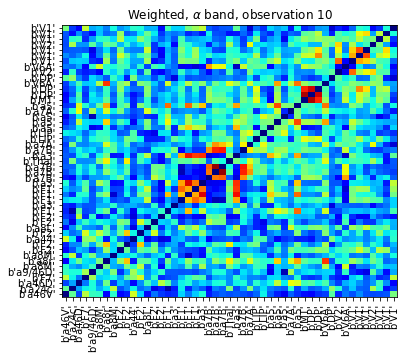

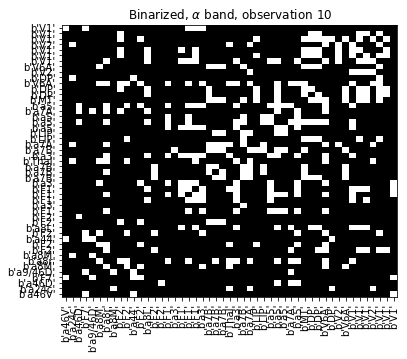

In [11]:
plot_adjacency(net.A[:,:,1,10], net.session_info['areas'], 'jet', (6,5))
plt.title(r'Weighted, $\alpha$ band, observation 10')
plot_adjacency(net.A[:,:,1,10]>net.coh_thr[1], net.session_info['areas'], 'gray', (6,5))
plt.title(r'Binarized, $\alpha$ band, observation 10')

Before moving the measures and preliminary results, during the analysis we may be interested to separate the measures we make by task stage, to do so we need some way to acess our arrays (super_tensor, adjacency matrix, node_degree...) in an specific stage. Using the method __create_stages_time_grid__, four array will be created inside the object: __t_baseline__, __t_cue__, __t_delay__, and __t_match__. Using those array any stage can be acessed easily, let's suposse you want the super tensor values only for the delay period in alpha band, you can retrieve this values by doing:

```net.super_tensor[:,1,net.t_baseline] ```

In [12]:
# Creating stages grid
net.create_stages_time_grid()

Now let's plot for each trial the duration of each period

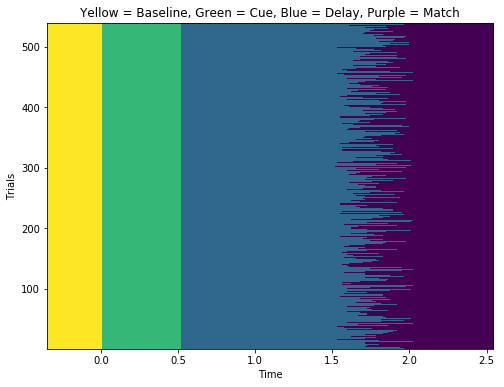

In [13]:
stages = np.zeros([net.session_info['nT'],len(net.tarray)])
ii     = [net.t_baseline.reshape(net.session_info['nT'],len(net.tarray)), 
          net.t_cue.reshape(net.session_info['nT'],len(net.tarray)), 
          net.t_delay.reshape(net.session_info['nT'],len(net.tarray)),
          net.t_match.reshape(net.session_info['nT'],len(net.tarray))]
for i in range(4):
    stages = stages - i * ii[i]
    
plt.figure(figsize = (8,6))
plt.imshow(stages, aspect='auto',cmap='viridis',origin='lower', extent=[net.tarray[0],net.tarray[-1],1,net.session_info['nT']])
plt.ylabel('Trials')
plt.xlabel('Time')
plt.title('Yellow = Baseline, Green = Cue, Blue = Delay, Purple = Match')
plt.savefig('../figures/layerwise_net/stages.png')

Similarly to separating the measurements by task stage, we could be insterested in separating them by cue type (i.e., by differenciating the cue presented to the monkey), to create the grid which allows us to acess trials were a specific cue was presented to the monkey the method __create_stim_grid__. This method will create an array named __stim_grid__ inside the __temporal_network__ object, this array will have the shape [Number of cues, Trials * Time]. Let's suposse you want the super tensor values in the alpha band only for the second cue type presented, you can retrieve this values by doing:

```net.super_tensor[:,1,net.stim_grid[1]] ```

In [14]:
net.create_stim_grid()

We can now visualize, for instance, which trials received each cue type (for the first 20 trials):

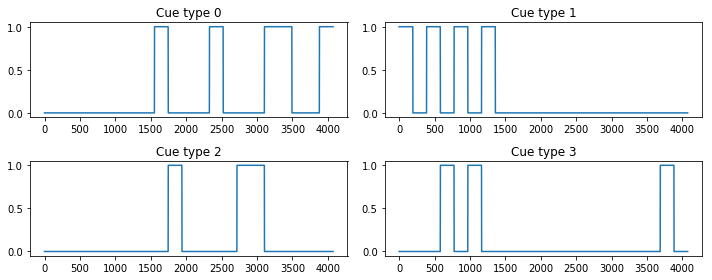

In [15]:
plt.figure(figsize=(10,4))
for i in range(net.stim_grid.shape[0]-1):
    plt.subplot(2,2,i+1)
    plt.plot(net.stim_grid[i,:21*len(net.tarray)])
    plt.title('Cue type ' + str(i))
plt.tight_layout()

In [16]:
# Values of q used
q_list     = np.linspace(0.2, 0.9, 10)
n_retained = np.zeros([len(q_list), len(net.bands), 4]) # [Values of q, Number of bands, Number of stages]
# Computing the threshold for the specific q value
for i in tqdm( range( len( q_list) ) ):
    net.compute_coherence_thresholds(q = q_list[i])
    for j in range( len(net.bands) ):
        # Binary super tensor
        bst               = net.super_tensor[:,j,:] > net.coh_thr[j]
        n_retained[i,j,0] = bst[:,net.t_baseline].sum() / (net.session_info['nP'] * net.t_baseline.sum())
        n_retained[i,j,1] = bst[:,net.t_cue].sum()      / (net.session_info['nP'] * net.t_cue.sum())
        n_retained[i,j,2] = bst[:,net.t_delay].sum()    / (net.session_info['nP'] * net.t_delay.sum())
        n_retained[i,j,3] = bst[:,net.t_match].sum()    / (net.session_info['nP'] * net.t_match.sum())

# Set q to 0.80 again
net.compute_coherence_thresholds(q=.8)

100%|██████████| 10/10 [11:34<00:00, 69.44s/it]


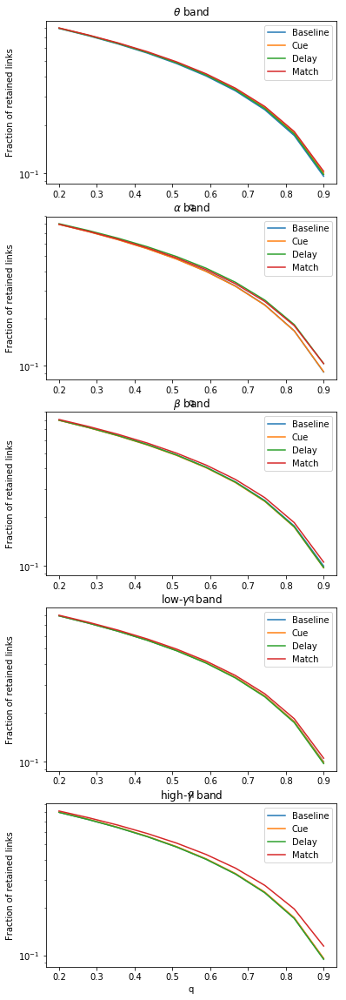

In [17]:
plt.figure(figsize=(6,20))
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    plt.semilogy(q_list, n_retained[:,j,0], label = 'Baseline')
    plt.semilogy(q_list, n_retained[:,j,1], label = 'Cue')
    plt.semilogy(q_list, n_retained[:,j,2], label = 'Delay')
    plt.semilogy(q_list, n_retained[:,j,3], label = 'Match')
    plt.title(bands[j] + ' band')
    plt.legend()
    plt.xlabel('q')
    plt.ylabel('Fraction of retained links')
plt.savefig('../figures/layerwise_net/fraction_reained_links.png')

### Analysing the dependece of coherence distributions on frequency, stage, and cue

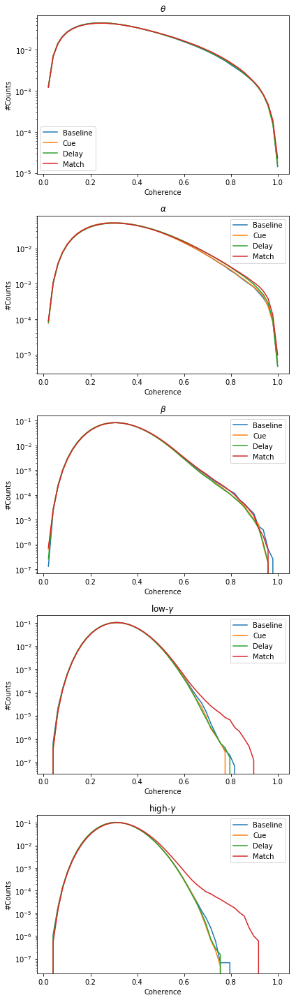

In [16]:
plt.figure(figsize=(6,20))
bins = np.linspace(0,1,50)
for i in range(len(bands)):
    plt.subplot(len(bands),1,i+1)
    nb, xb = np.histogram(net.super_tensor[:,i,net.t_baseline].flatten(), bins=bins)
    nc, xc = np.histogram(net.super_tensor[:,i,net.t_cue].flatten(), bins=bins)
    nd, xd = np.histogram(net.super_tensor[:,i,net.t_delay].flatten(), bins=bins)
    nm, xm = np.histogram(net.super_tensor[:,i,net.t_match].flatten(), bins=bins)
    # Normalizing histograms
    nb = nb / nb.sum()
    nc = nc / nc.sum()
    nd = nd / nd.sum()
    nm = nm / nm.sum()
    plt.semilogy(xb[1:], nb) 
    plt.semilogy(xc[1:], nc) 
    plt.semilogy(xd[1:], nd) 
    plt.semilogy(xm[1:], nm) 
    plt.title(bands[i])
    plt.legend(['Baseline', 'Cue', 'Delay', 'Match'])
    plt.xlabel('Coherence')
    plt.ylabel('#Counts')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/pooled_st_dist_per_band.png') 

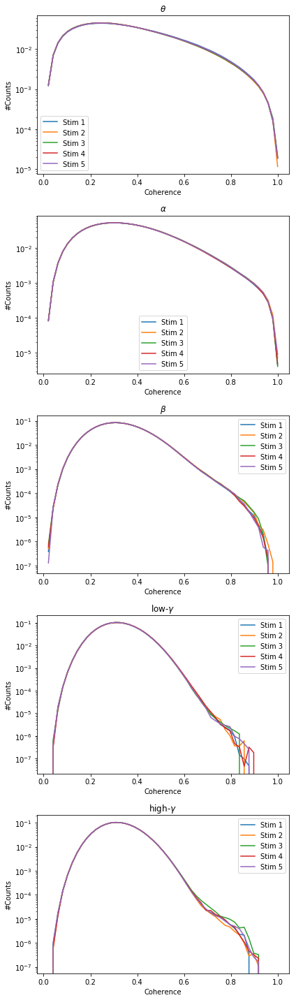

In [17]:
plt.figure(figsize=(6,20))
bins = np.linspace(0,1,50)
for j in range(len(bands)):
    plt.subplot(5,1,j+1)
    for i in range(net.stim_grid.shape[0]):
        #  Computing histograms
        nb, xb = np.histogram(net.super_tensor[:,j,net.stim_grid[i].astype(bool)].flatten(), bins=bins)
        #  Normalizing histograms
        nb     = nb / nb.sum()
        plt.semilogy(xb[1:], nb)
    plt.title(bands[j])
    plt.legend(['Stim 1', 'Stim 2', 'Stim 3', 'Stim 4', 'Stim 5'])
    plt.xlabel('Coherence')
    plt.ylabel('#Counts')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/pooled_st_dist_per_cue.png')

100%|██████████| 5/5 [00:16<00:00,  3.34s/it]


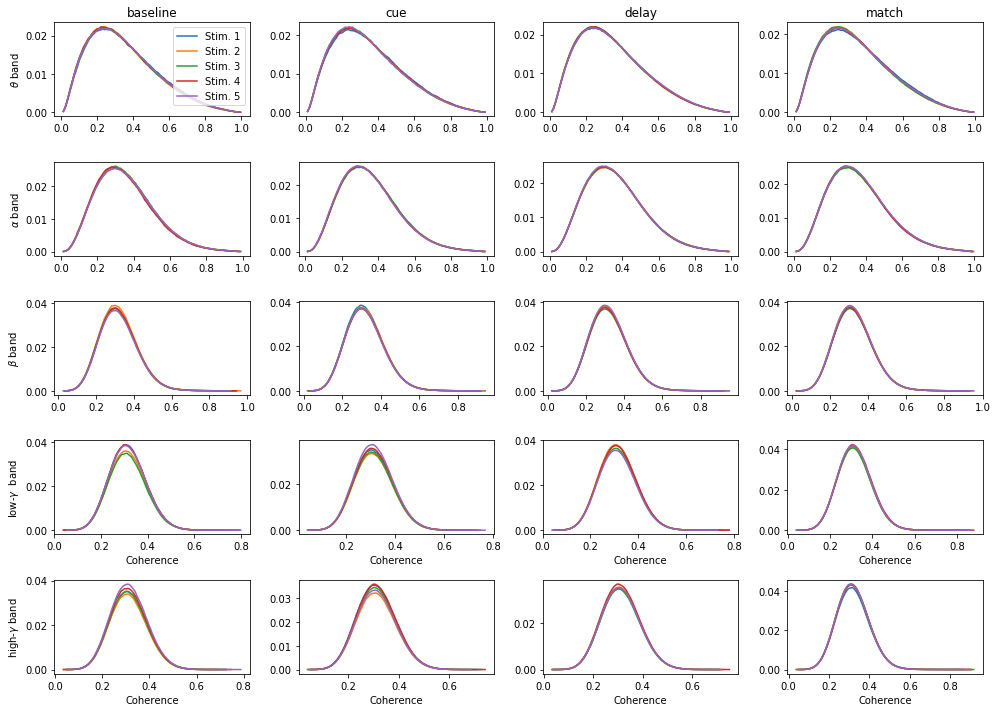

In [18]:
s = ['baseline', 'cue', 'delay', 'match']
plt.figure(figsize=(14,10))
count = 1
for i in tqdm( range(len(net.bands)) ):
    for j in range(4):
        if j == 0: t_idx = net.t_baseline
        if j == 1: t_idx = net.t_cue
        if j == 2: t_idx = net.t_delay
        if j == 3: t_idx = net.t_match
        plt.subplot(5,4,count)
        for k in range(net.stim_grid.shape[0]):
            # Histograms
            c, x = np.histogram(net.super_tensor[:,i,(t_idx*net.stim_grid[k]).astype(bool)], 100)
            plt.plot(x[1:],c/c.sum(), label = 'Stim. ' + str(k+1))
            if count == 1: plt.legend()
            if count >= 13: plt.xlabel('Coherence')
            if count in [1,5,9,13, 17]: plt.ylabel(bands[i] + ' band')
            if count in [1,2,3,4]: plt.title(s[j])
        count+=1
plt.tight_layout()       

### Null models and temporal correlations

#### Creating null models for each band and randomized edges and time frames.

In [16]:
# Shuffling frames
A_s = np.empty_like(net.A)
# Randomizing edges
A_r = np.empty_like(net.A)

In [17]:
for i in tqdm(range(len(net.bands))):
    A_s[:,:,i,:] = shuffle_frames(net.A[:,:,i,:])

100%|██████████| 5/5 [00:27<00:00,  5.58s/it]


In [18]:
for i in tqdm(range(len(net.bands))):
    A_r[:,:,i,:] = randomize_edges(net.A[:,:,i,:], thr = net.coh_thr[i], n_rewires=1000)

100%|██████████| 5/5 [07:12<00:00, 86.57s/it]


/home/vinicius/GrayData-Analysis/GDa/net/temporal.py:22: RuntimeWarning: invalid value encountered in true_divide
  Ci  = np.nansum(( num / den ), axis=1) / (A.shape[-1] - 1)


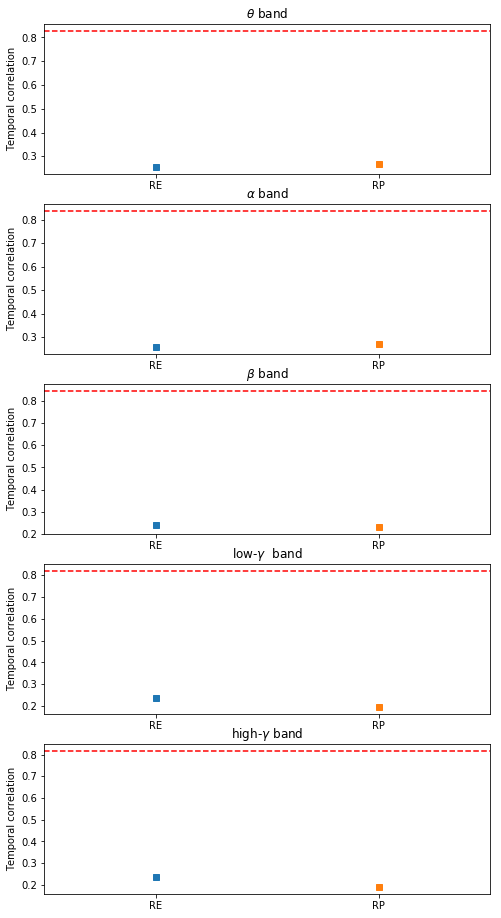

In [19]:
plt.figure(figsize=(8,16))
for i in range(len(net.bands)):
    # Original network
    CC_on = compute_temporal_correlation(net.A[:,:,i,:],   thr=net.coh_thr[i])
    # Randomize on edges
    CC_re = compute_temporal_correlation(A_r[:,:,i,:], thr=net.coh_thr[i])
    # Randomize on time
    CC_rt = compute_temporal_correlation(A_s[:,:,i,:], thr=net.coh_thr[i])
    # Plotting
    plt.subplot(5,1,i+1)
    plt.plot(1, CC_re, marker='s')
    plt.plot(3, CC_rt, marker='s')
    plt.hlines(CC_on, 0, 4, linestyle='--', color = 'r')
    plt.xlim([0,4])
    plt.ylabel('Temporal correlation')
    plt.xticks([1,3], ['RE', 'RP'])
    plt.title(bands[i] + ' band')

### Cosine similarity

In [16]:
C = {}
for i in tqdm( range(len(net.bands)) ): 
    A_aux = net.reshape_trials(net.A[:,:,i,:])
    C[str(i)] = cosine_similarity(A_aux, thr=None, mirror=True)

100%|██████████| 5/5 [00:32<00:00,  6.45s/it]


100%|██████████| 5/5 [00:00<00:00, 10.55it/s]


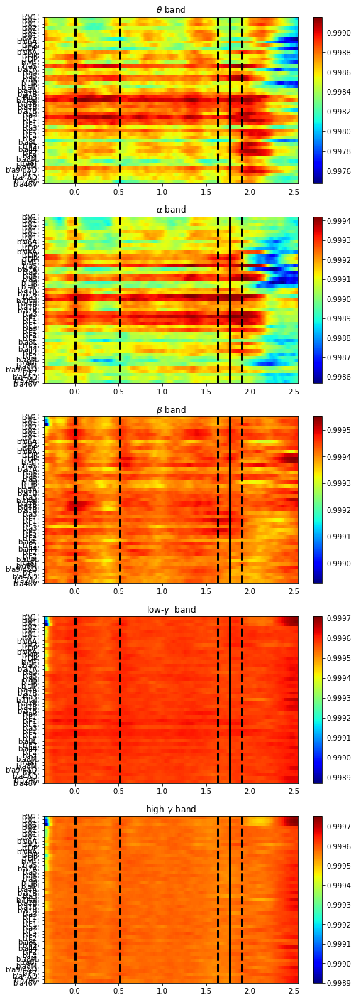

In [17]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    plt.imshow(np.nansum(C[str(i)],axis=1)/C[str(i)].shape[1], aspect = 'auto', 
               cmap = 'jet', origin = 'lower',
               extent = [net.tarray[0],net.tarray[-1],1,49])
    plt.colorbar()
    plt.vlines(0, 1, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   1, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       1, 49, linestyle='-', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       1, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       1, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.yticks(range(1,50), net.session_info['areas'])
    plt.title(bands[i] + ' band')

100%|██████████| 5/5 [00:00<00:00,  9.99it/s]


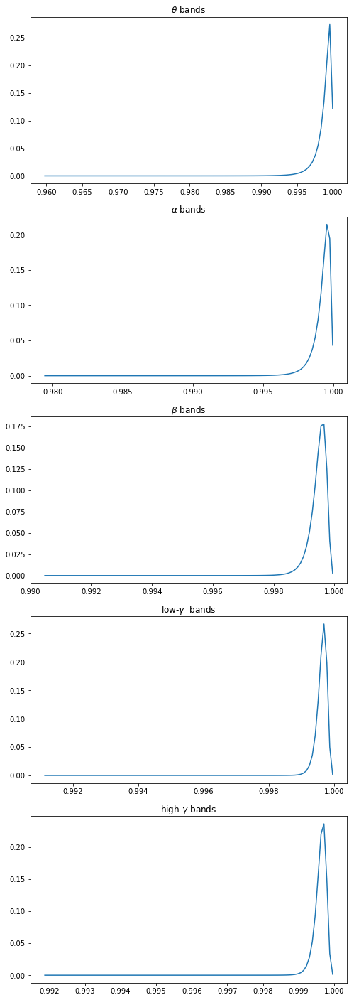

In [18]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    c, x = np.histogram(C[str(i)].flatten(order='C'), 100)
    plt.plot(x[1:], c/np.sum(c))
    plt.title(bands[i] + ' bands')

### Jaccard index

In [19]:
J = {}
for i in tqdm( range(len(net.bands)) ): 
    A_aux = net.reshape_trials(net.A[:,:,i,:])
    J[str(i)] = jaccard_index(A_aux, thr=net.coh_thr[i], mirror=True)

100%|██████████| 5/5 [00:26<00:00,  5.22s/it]


100%|██████████| 5/5 [00:00<00:00, 10.77it/s]


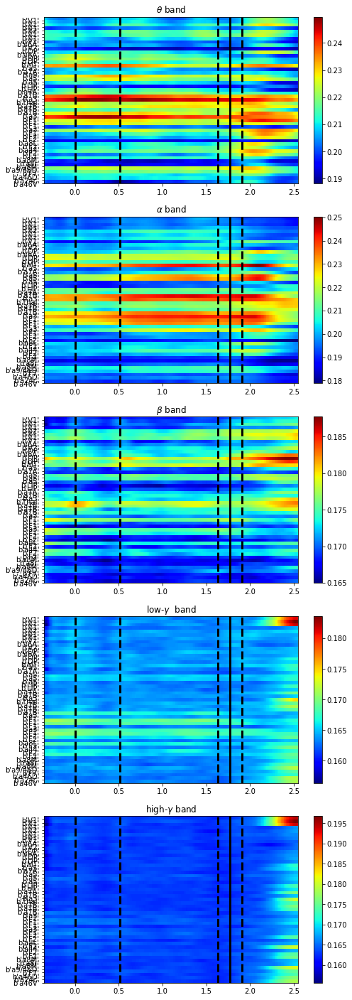

In [20]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    plt.imshow(np.nansum(J[str(i)], axis=1)/J[str(i)].shape[1], aspect = 'auto', 
                         cmap = 'jet', origin = 'lower',
                         extent = [net.tarray[0],net.tarray[-1],0,49]);plt.colorbar()
    plt.vlines(0, 0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       0, 49, linestyle='-', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.yticks(range(49), net.session_info['areas'])
    plt.title(bands[i] + ' band')

100%|██████████| 5/5 [00:00<00:00,  8.29it/s]


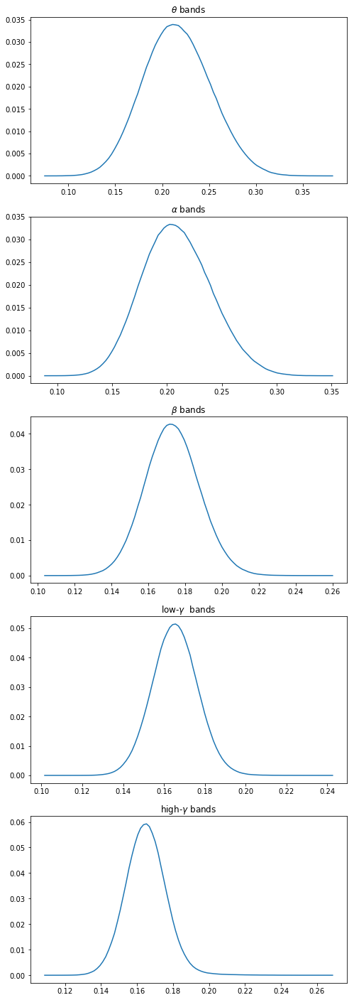

In [21]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    c, x = np.histogram(J[str(i)][~np.isnan(J[str(i)])].flatten(order='C'), 100)
    plt.plot(x[1:], c/np.sum(c))
    plt.title(bands[i] + ' bands')

### Relative links' thresholds

In [11]:
net.compute_coherence_thresholds(q = 0.8, relative = True)

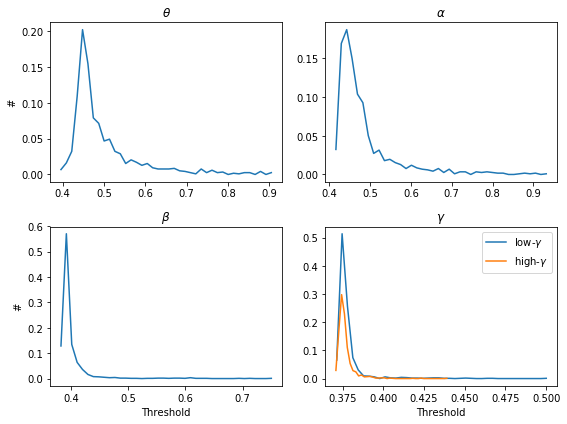

In [20]:
plt.figure(figsize=(8,6))
for i in range(len(bands)-1):
    plt.subplot(2,2,i+1)
    if i == 3:
        # low-gamma
        n,x = np.histogram(net.coh_thr[i], bins = 40)
        n   = n/n.sum()
        plt.plot(x[1:], n, label=r'low-$\gamma$')
        # high-gamma
        n,x = np.histogram(net.coh_thr[i+1], bins = 40)
        n   = n/n.sum()
        plt.plot(x[1:], n, label=r'high-$\gamma$')
        plt.title(r'$\gamma$')
        plt.legend()
    else:
        n,x = np.histogram(net.coh_thr[i], bins = 40)
        n   = n/n.sum()
        plt.plot(x[1:], n)
        plt.title(bands[i])
    if i==2 or i==3: plt.xlabel('Threshold')
    if i==0 or i==2: plt.ylabel('#')
plt.tight_layout()

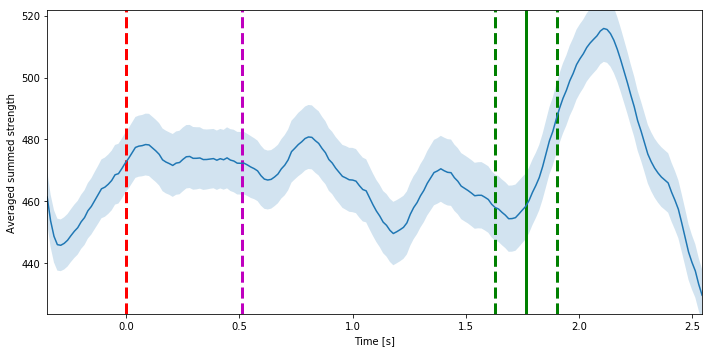

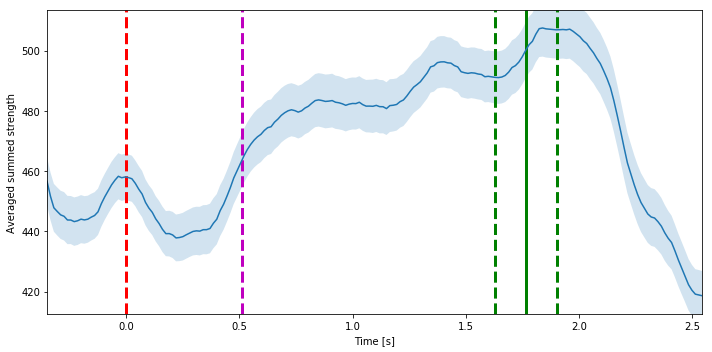

In [ ]:
for i in range(len(bands)):

    a = net.super_tensor[:,i,:] > net.coh_thr[i][:,None]

    A = np.zeros([net.session_info['nC'], net.session_info['nC'],net.session_info['nT']*len(net.tarray)])
    for p in range(net.session_info['pairs'].shape[0]):
        i, j = net.session_info['pairs'][p,0], net.session_info['pairs'][p,1]
        A[i,j,:]   = a[p,:]

    d = compute_nodes_degree(A, thr = None, mirror=True)
    c = net.reshape_trials(d).sum(axis = 0).mean(axis=0)
    e = net.reshape_trials(d).sum(axis = 0).std(axis=0)/(c.shape[0]**0.5)
    plt.figure(figsize=(10,5))
    plt.plot(net.tarray, c)
    plt.fill_between(net.tarray, c-e, c+e, alpha = .2)
    #plt.title(bands[i] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([c.min()-6, c.max()+6])
    plt.vlines(0, c.min()-6, c.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   c.min()-6, c.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       c.min()-6, c.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       c.min()-6, c.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       c.min()-6, c.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
    plt.tight_layout()

### Network measures

The measures (degree, clustering, coreness, and modularity) were calculate beforehad (see script save_network_analysis.py) to save time here we simply load the results to plot.

In [16]:
Q_data  = np.load('../network_statistics/tt_1_br_1.npy', allow_pickle=True).item()
Q       = Q_data['original']
Qr      = Q_data['null']

### Node degree

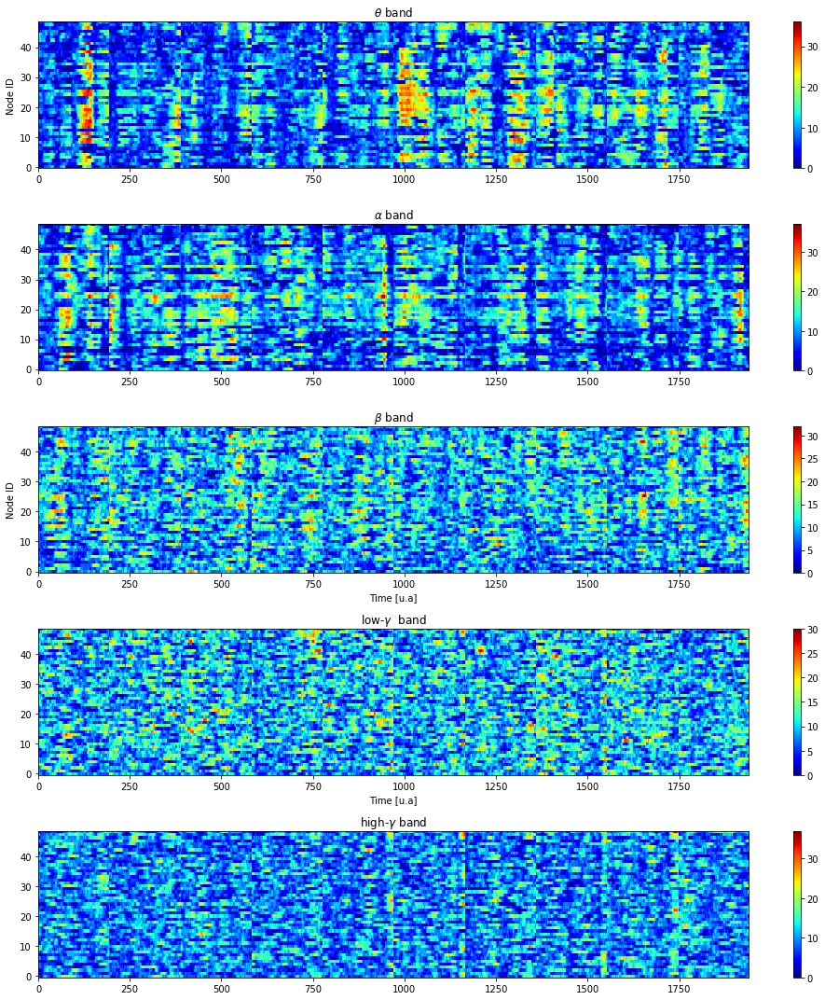

In [17]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(Q['degree'][str(i)][:,:10*len(net.tarray)], aspect='auto', cmap='jet', origin='lower')
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_degree.png')

It is hard to compare both the weighted and binary version of the measure by means of the raster plot, however we can measure the summed strength/degree of the network for a more general view. Let's plot the the summed degree avareged on trials for each frequency band:

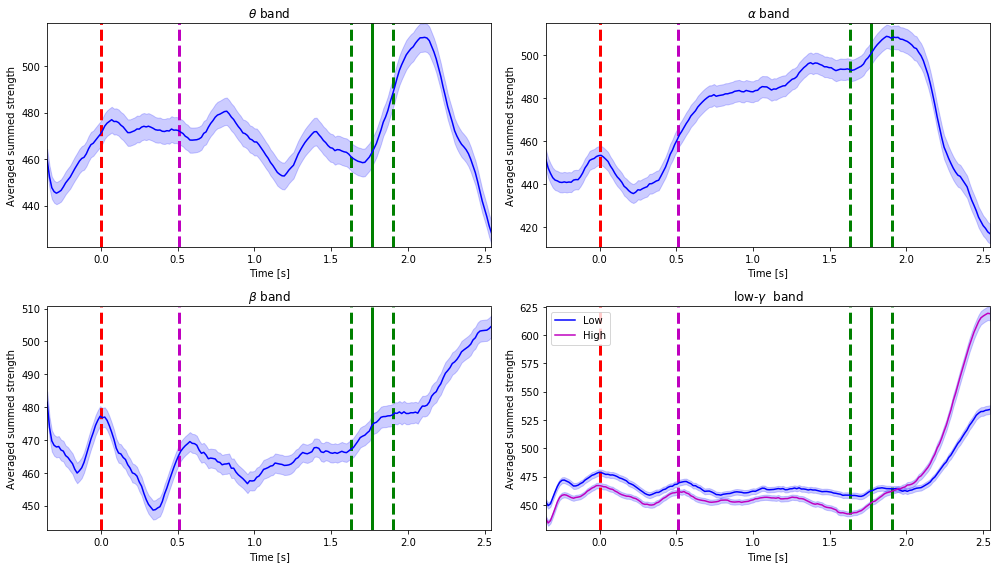

In [18]:
plt.figure(figsize=(14,8))
c = ['b', 'r']
for j in range( len(net.bands)-1 ):
    plt.subplot(2,2,j+1)
    # Original
    #s_d = Q['degree'][str(j)].sum(axis=0)
    #s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
    #s_d_m = s_d.mean(axis = 0)
    #s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    if j == 3:
        s_d = Q['degree'][str(j)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        s_d = Q['degree'][str(j+1)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'm')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        plt.legend(['Low', 'High'])
    else:
        s_d = Q['degree'][str(j)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_strength.png')

Last but not least, we can instead of average over all trials take the average by trials that the same cue was applied:

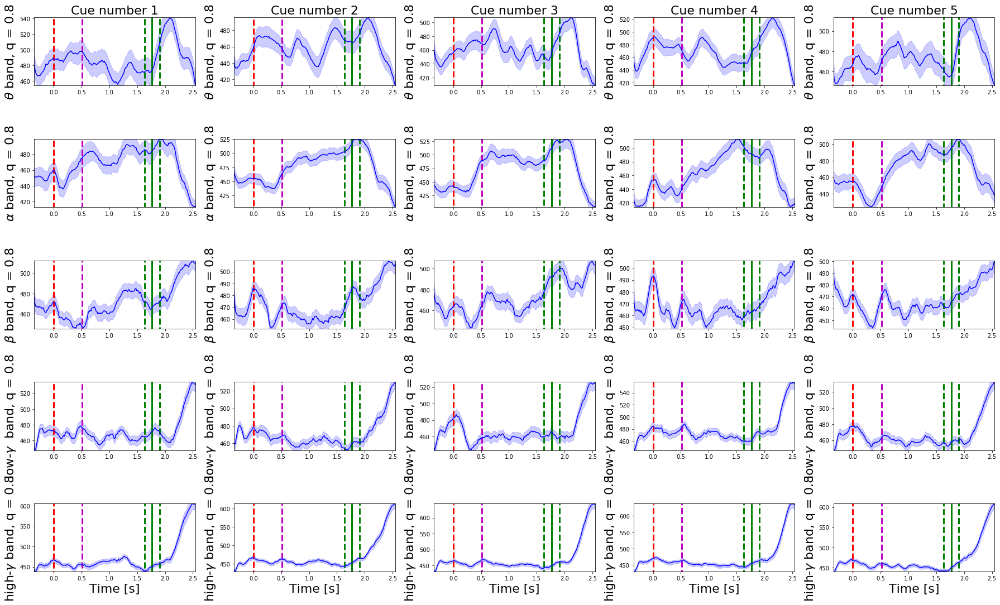

In [19]:
idx = 1
plt.figure(figsize=(25,15))
for i in range( len(net.bands) ):
    for j in range( net.stim_grid.shape[0] ):
        # Computing average over trials for specific cue number
        nt  = np.sum(net.session_info['stim']==j+1)
        s_d = Q['degree'][str(i)].sum(axis=0)
        #s_d = net.coreness[1,:,i,:].sum(axis=0)
        s_d = s_d[net.stim_grid[j].astype(bool)].reshape(nt, len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        # plot
        plt.subplot( len(net.bands), net.stim_grid.shape[0], idx)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, color = 'b', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([s_d_m.min()-.5, s_d_m.max()+.5])
        plt.vlines(0, s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'r')
        plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'm')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='-', linewidth = 3, color = 'g')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'g')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'g')
        plt.ylabel(bands[i] + ' band, q = 0.8', fontsize=22)
        idx += 1
        if i == 0:
            plt.title('Cue number ' + str(j+1), fontsize=22)
        if i == 4:
            plt.xlabel('Time [s]', fontsize=22)
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_degree_bands_cue.png')

### CC between strength and degree as a function of threshold

In [35]:
q_list= np.linspace(0.2, 0.9, 10)
cc_ns = np.zeros([len(q_list), len(net.bands) ])
for i in tqdm (range( len(q_list) )):
    net.compute_coherence_thresholds(q = q_list[i])
    for j in range( len(net.bands) ):
        # Degree
        degree   = compute_nodes_degree(net.A[:,:,j,:], thr = net.coh_thr[j]).sum(axis = 0)
        # Strength
        strength = compute_nodes_degree(net.A[:,:,j,:], thr = None).sum(axis = 0)
        # Correlation
        cc_ns[i,j] =np.corrcoef(strength, degree)[0,1]

100%|██████████| 10/10 [11:50<00:00, 71.09s/it]


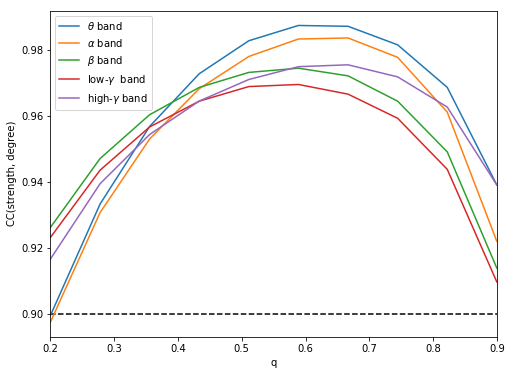

In [36]:
plt.figure(figsize=(8,6))
for j in range( len(net.bands) ):
    plt.plot(q_list, cc_ns[:,j], label = bands[j] + ' band')
    plt.ylabel('CC(strength, degree)')
    plt.xlabel('q')
plt.xlim([0.2,0.9])
plt.hlines(0.90,0.2,0.9, linestyle = '--', color = 'k')
plt.legend()
plt.savefig('../figures/layerwise_net/cc_st_dg.png')

In [37]:
# Put threshold back to q = 0.8
net.compute_coherence_thresholds(q = 0.8)

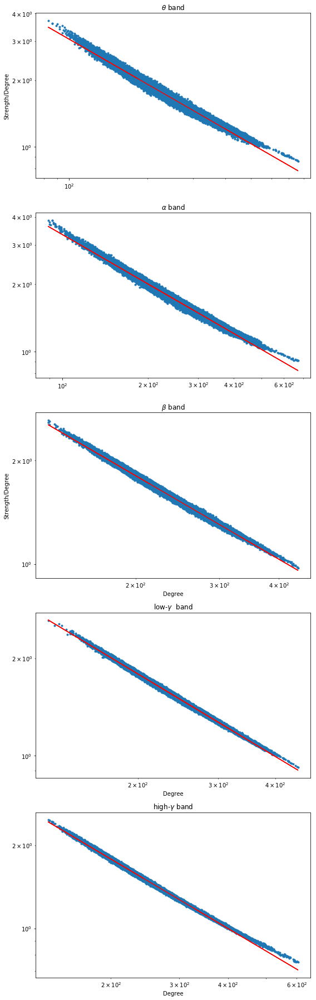

In [38]:
plt.figure(figsize=(8,25))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Degree 
    degree   = compute_nodes_degree(net.A[:,:,j,:], thr = net.coh_thr[j]).sum(axis = 0)
    # Strength
    strength = compute_nodes_degree(net.A[:,:,j,:], thr = None).sum(axis = 0)
    plt.loglog(degree, strength/degree, '.')
    # Linear fit
    p = np.polyfit(np.log(degree), np.log(strength/degree), 1)
    x = np.linspace(degree.min(), degree.max(),100)
    A = np.exp(p[1])
    y = A*(degree)**p[0]
    plt.loglog(degree, y, 'r-')
    plt.title(bands[j] + ' band')
    if j == 0 or j == 2: plt.ylabel('Strength/Degree')
    if j >=2: plt.xlabel('Degree')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/strength_degree_relation.png')

### Randomized networks preserving degree

AttributeError: 'dict' object has no attribute 'sum'

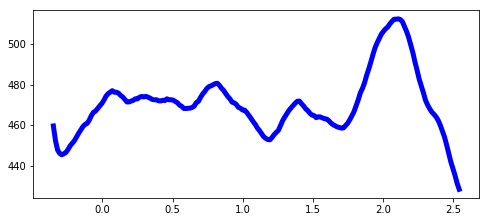

In [28]:
plt.figure(figsize=(8,20))
for j in range( len(net.bands)-1 ):
    plt.subplot(5,1,j+1)
    # Original
    s_d = Q['degree'][str(j)].sum(axis=0)
    s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d = Qr['degree'][str(j)].sum(axis=0)
    s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed degree')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/strength_random_edges.png')

### Coreness 

The analysis below are all done for the binary network. First, we can do the same analysis measuring the k-coreness of the each node:

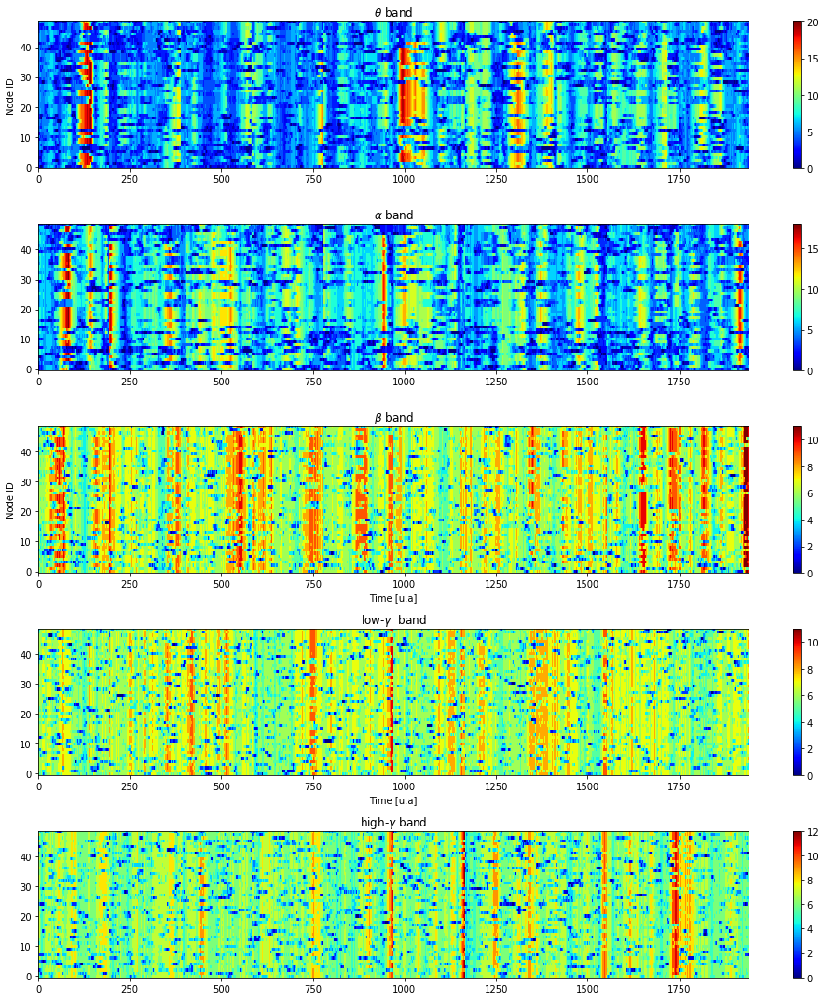

In [20]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(Q['coreness'][str(i)][:,:10*len(net.tarray)], aspect='auto', cmap='jet', origin='lower')
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_coreness.png')

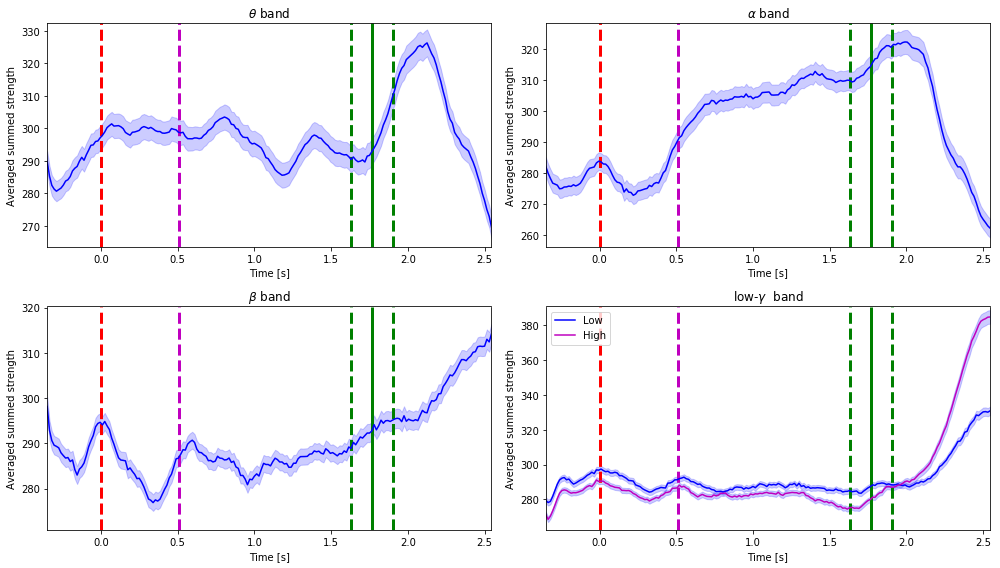

In [21]:
plt.figure(figsize=(14,8))
c = ['b', 'r']
for j in range( len(net.bands)-1 ):
    plt.subplot(2,2,j+1)
    # Original
    #s_d = Q['degree'][str(j)].sum(axis=0)
    #s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
    #s_d_m = s_d.mean(axis = 0)
    #s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    if j == 3:
        s_d = Q['coreness'][str(j)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        s_d = Q['coreness'][str(j+1)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'm')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        plt.legend(['Low', 'High'])
    else:
        s_d = Q['coreness'][str(j)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_coreness.png')

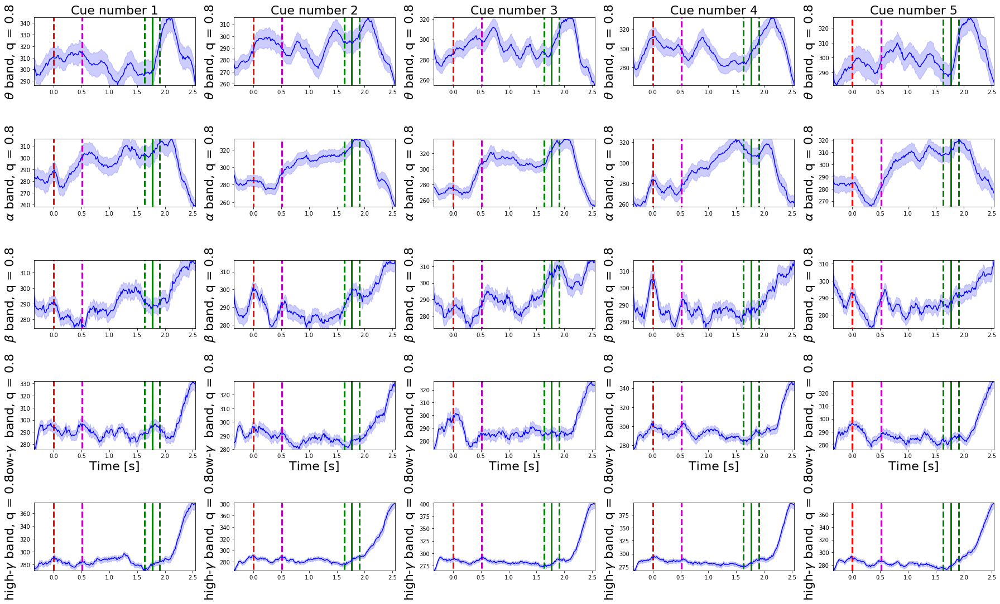

In [22]:
idx = 1
plt.figure(figsize=(25,15))
for i in range( len(net.bands) ):
    for j in range( net.stim_grid.shape[0] ):
        # Computing average over trials for specific cue number
        nt  = np.sum(net.session_info['stim']==j+1)
        s_d = Q['coreness'][str(i)].sum(axis=0)
        #s_d = net.coreness[1,:,i,:].sum(axis=0)
        s_d = s_d[net.stim_grid[j].astype(bool)].reshape(nt, len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        # plot
        plt.subplot( len(net.bands), net.stim_grid.shape[0], idx)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, color = 'b', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([s_d_m.min()-.5, s_d_m.max()+.5])
        plt.vlines(0, s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'r')
        plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'm')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='-', linewidth = 3, color = 'g')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'g')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'g')
        plt.ylabel(bands[i] + ' band, q = 0.8', fontsize=22)
        idx += 1
        if i == 0:
            plt.title('Cue number ' + str(j+1), fontsize=22)
        if i == 3:
            plt.xlabel('Time [s]', fontsize=22)
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_coreness_bands_cue.png')

### Coreness - Excess

100%|██████████| 5/5 [00:00<00:00, 32.39it/s]


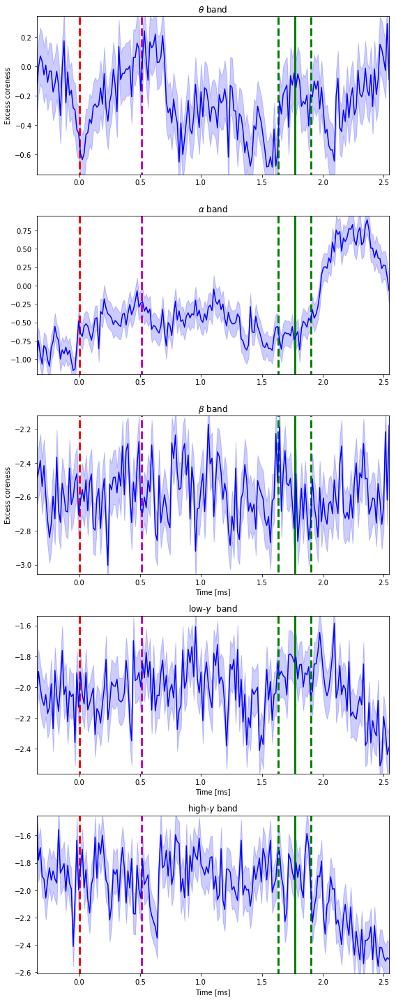

In [23]:
plt.figure(figsize=(8,20))
for j in tqdm( range(net.bands.shape[0]) ):
    # Summed for nodes
    null = net.reshape_trials(Qr['coreness'][str(j)]).sum(axis = 0)
    orig = net.reshape_trials(Q['coreness'][str(j)]).sum(axis = 0)
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = E.mean(axis = 0)
    # Std over trials
    Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
    # Plotting
    plt.subplot(5,1,j+1)
    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([Em.min()-.05, Em.max()+.05])
    if j == 0 or j == 2: plt.ylabel('Excess coreness')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_coreness.png')

### Clustering

Next we compute the clustering coefficient.

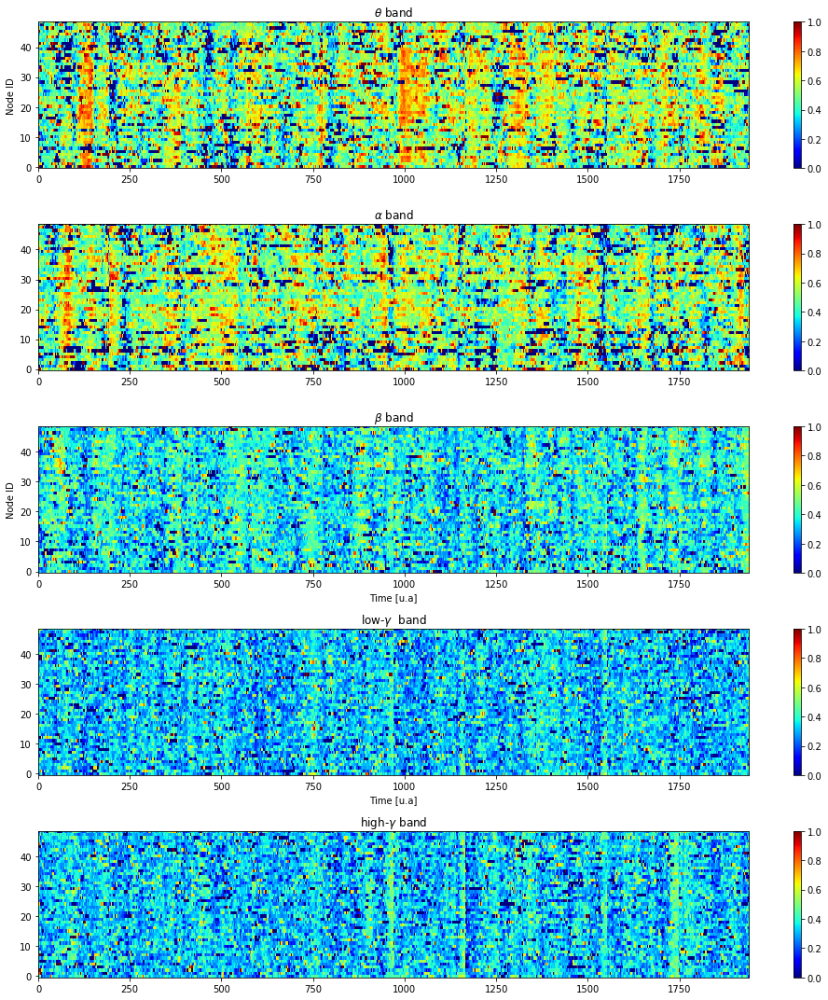

In [24]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(Q['clustering'][str(i)][:,:10*len(net.tarray)], aspect='auto', cmap='jet', origin='lower')
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_clustering.png')

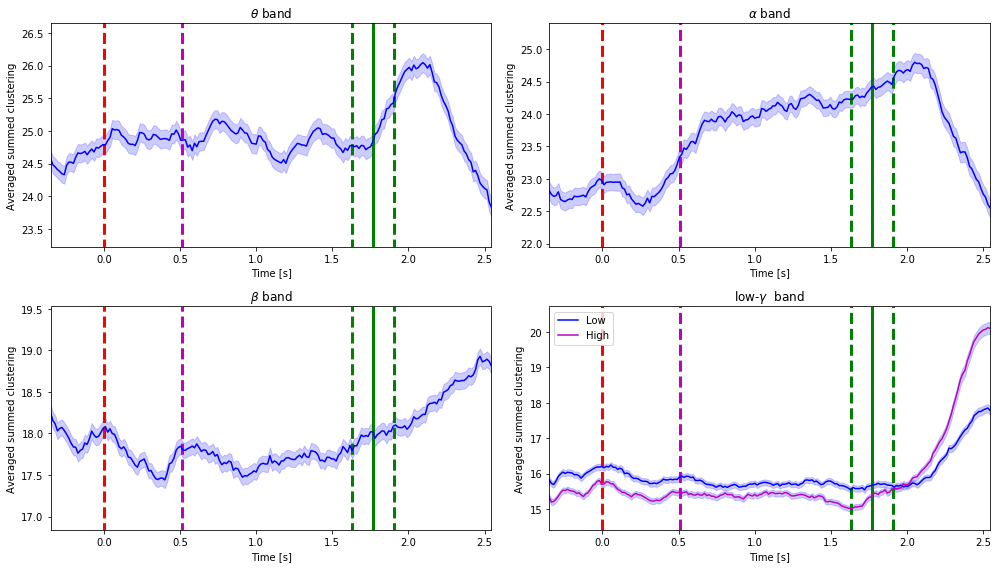

In [25]:
plt.figure(figsize=(14,8))
c = ['b', 'r']
for j in range( len(net.bands)-1 ):
    plt.subplot(2,2,j+1)
    # Original
    #s_d = Q['degree'][str(j)].sum(axis=0)
    #s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
    #s_d_m = s_d.mean(axis = 0)
    #s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    if j == 3:
        s_d = Q['clustering'][str(j)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        s_d = Q['clustering'][str(j+1)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'm')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        plt.legend(['Low', 'High'])
    else:
        s_d = Q['clustering'][str(j)].sum(axis=0)
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.6, s_d_m.max()+.6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_clustering.png')

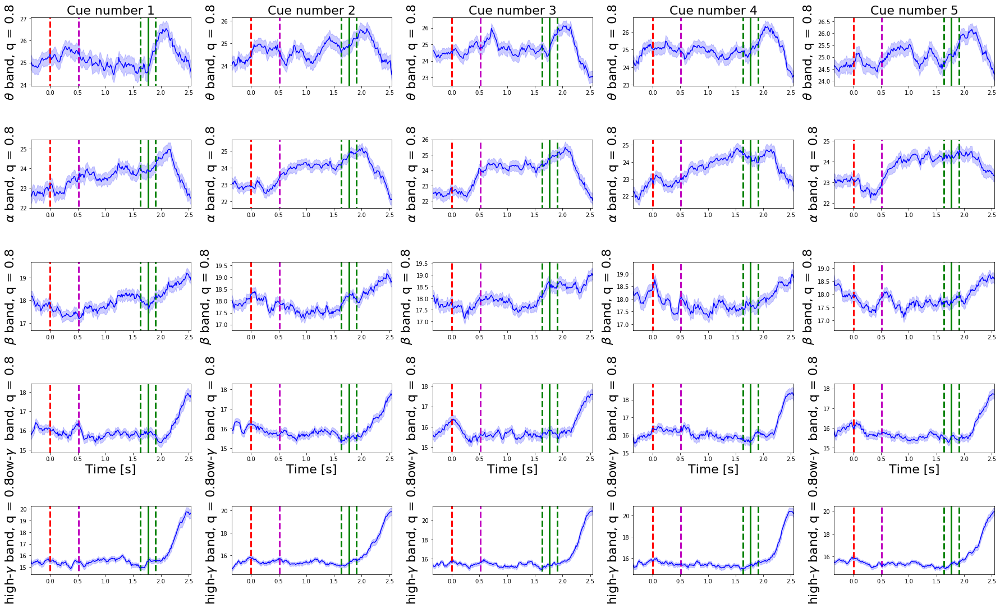

In [26]:
idx = 1
plt.figure(figsize=(25,15))
for i in range( len(net.bands) ):
    for j in range( net.stim_grid.shape[0] ):
        # Computing average over trials for specific cue number
        nt  = np.sum(net.session_info['stim']==j+1)
        s_d = Q['clustering'][str(i)].sum(axis=0)
        #s_d = net.coreness[1,:,i,:].sum(axis=0)
        s_d = s_d[net.stim_grid[j].astype(bool)].reshape(nt, len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        # plot
        plt.subplot( len(net.bands), net.stim_grid.shape[0], idx)
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, color = 'b', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([s_d_m.min()-.5, s_d_m.max()+.5])
        plt.vlines(0, s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'r')
        plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'm')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='-', linewidth = 3, color = 'g')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'g')
        plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-14, s_d_m.max()+14, linestyle='--', linewidth = 3, color = 'g')
        plt.ylabel(bands[i] + ' band, q = 0.8', fontsize=22)
        idx += 1
        if i == 0:
            plt.title('Cue number ' + str(j+1), fontsize=22)
        if i == 3:
            plt.xlabel('Time [s]', fontsize=22)
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_clustering_bands_cue.png')

### Clustering - Excess

100%|██████████| 5/5 [00:00<00:00, 23.36it/s]


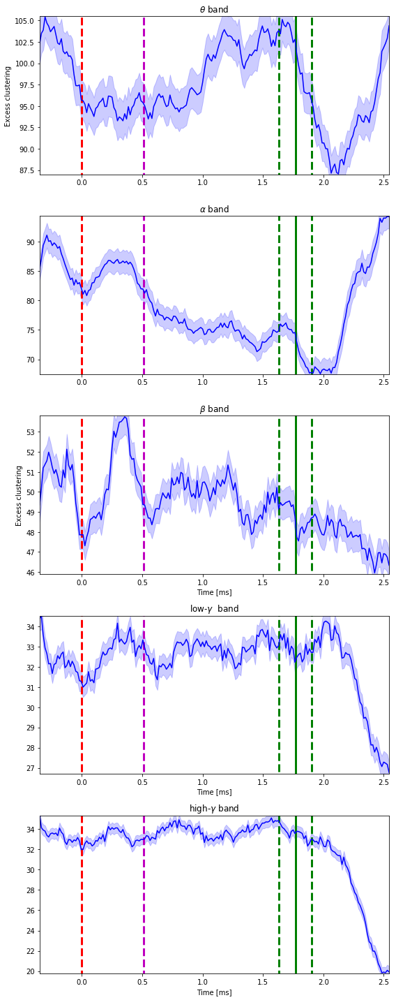

In [39]:
plt.figure(figsize=(8,20))
for j in tqdm( range(net.bands.shape[0]) ):
    # Summed for nodes
    null = net.reshape_trials(Qr['clustering'][str(j)]).sum(axis = 0)
    orig = net.reshape_trials(Q['clustering'][str(j)]).sum(axis = 0)
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = E.mean(axis = 0)
    # Std over trials
    Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
    # Plotting
    plt.subplot(5,1,j+1)
    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([Em.min()-.05, Em.max()+.05])
    if j == 0 or j == 2: plt.ylabel('Excess clustering')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_clustering.png')

### Modularity

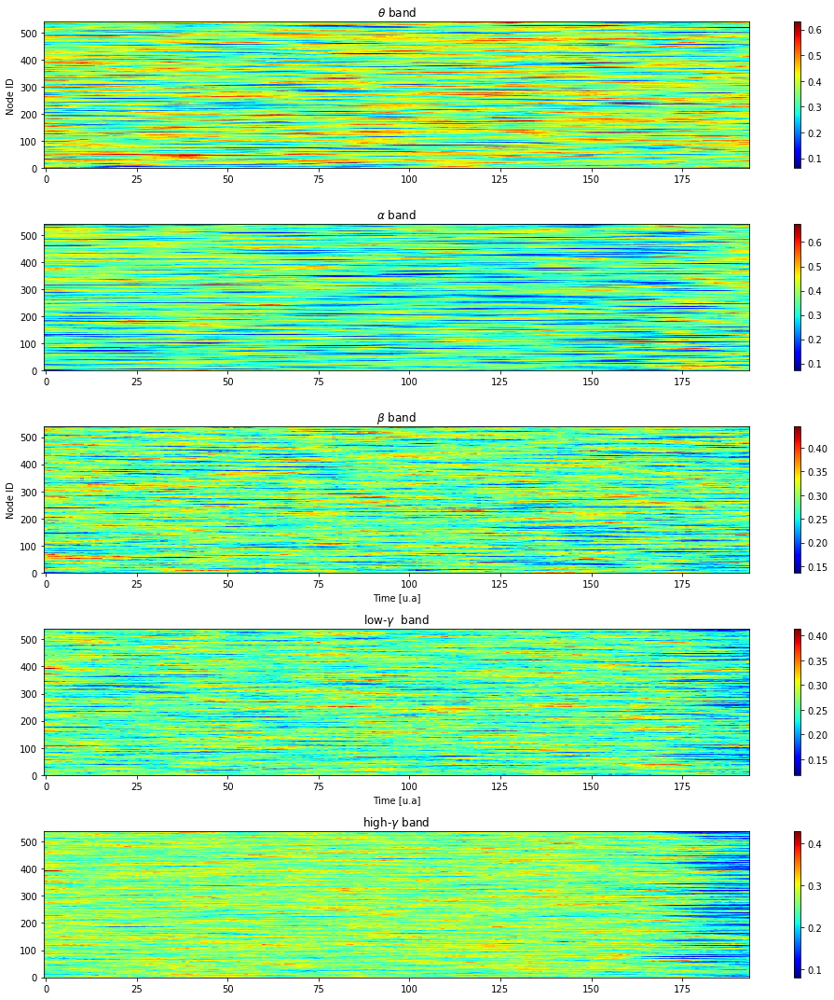

In [40]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(net.reshape_trials( Q['modularity'][str(i)] ), aspect='auto', cmap='jet', origin='lower')
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_modularity.png')

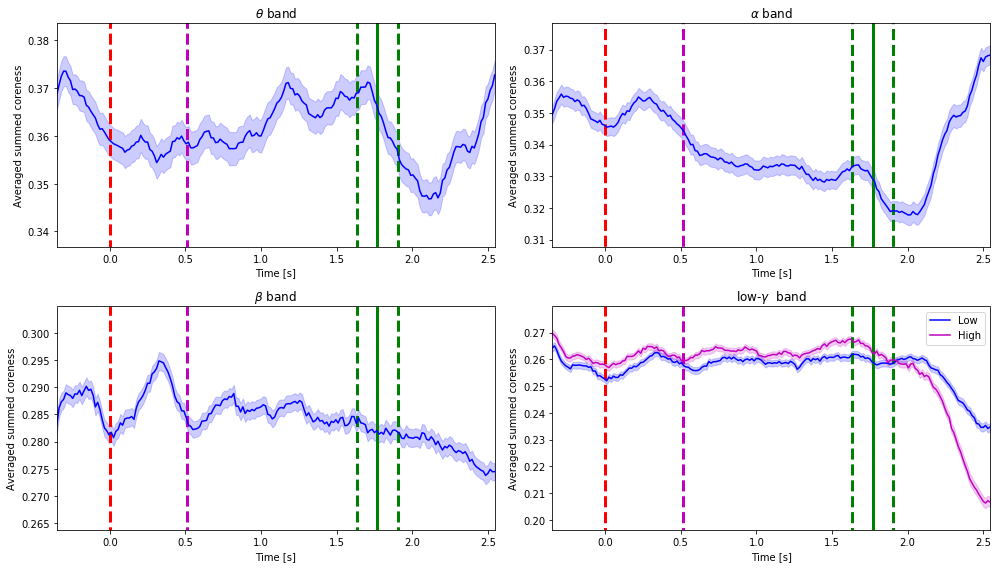

In [41]:
plt.figure(figsize=(14,8))
c = ['b', 'r']
for j in range( len(net.bands)-1 ):
    plt.subplot(2,2,j+1)
    # Original
    if j < 3:
        s_d = Q['modularity'][str(j)]
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        #
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        #
        plt.title(bands[j] + ' band')
    else:
        s_d = Q['modularity'][str(j)]
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        #
        plt.plot(net.tarray, s_d_m, color = 'b')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
        #
        plt.title(bands[j] + ' band')
        #
        s_d = Q['modularity'][str(j+1)]
        s_d = s_d.reshape(net.session_info['nT'],len(net.tarray))
        s_d_m = s_d.mean(axis = 0)
        s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
        #
        plt.plot(net.tarray, s_d_m, color = 'm')
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')
        plt.legend(['Low', 'High'])
        #
        plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.01, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_modularity.png')

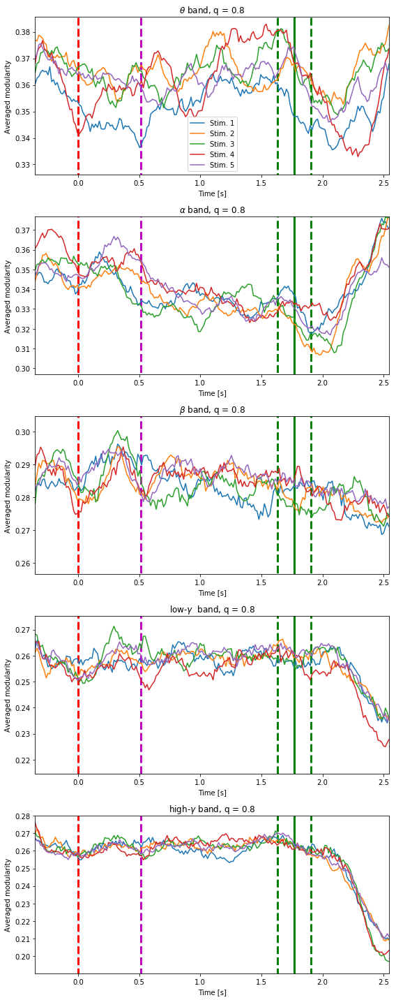

In [42]:
plt.figure(figsize=(8,20))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    s_d = Q['modularity'][str(j)]
    for i in range(net.stim_grid.shape[0]):
        nt  = np.sum(net.session_info['stim']==i+1)
        s_d_aux = s_d[net.stim_grid[i].astype(bool)].copy()
        s_d_aux = s_d_aux.reshape(nt,len(net.tarray))
        s_d_m = s_d_aux.mean(axis = 0)
        s_d_e = s_d_aux.std(axis = 0) / (s_d.shape[0]**0.5)
        plt.plot(net.tarray, s_d_m)
        plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2)
    plt.title(bands[j] + ' band, q = 0.8')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-0.02, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
    if j == 0:
        plt.legend(['Stim. 1', 'Stim. 2', 'Stim. 3', 'Stim. 4', 'Stim. 5'])
    plt.ylabel('Averaged modularity')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/modularity_cues.png')

###  Modularity - Chance level

100%|██████████| 4/4 [00:00<00:00, 39.11it/s]


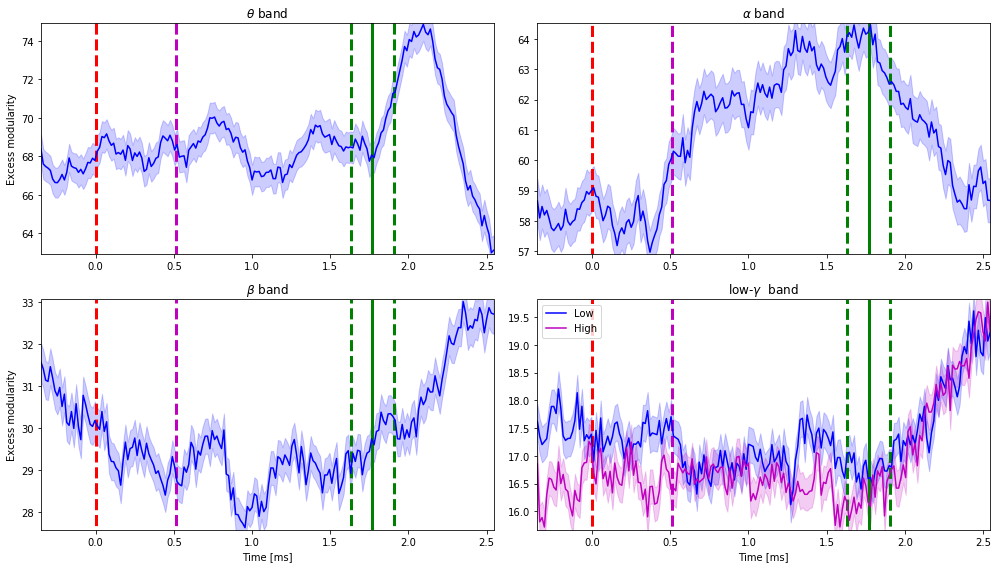

In [43]:
plt.figure(figsize=(14,8))
for j in tqdm( range(net.bands.shape[0]-1) ):
    plt.subplot(2,2,j+1)
    if j<3:
        # Summed for nodes
        null = net.reshape_trials(Qr['modularity'][str(j)])
        orig = net.reshape_trials(Q['modularity'][str(j)])
        # Excess 
        E    = 100*(orig - null)/null
        # Average over trials
        Em   = E.mean(axis = 0)
        # Std over trials
        Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
        # Plotting

        plt.plot(net.tarray, Em, color = 'b')
        plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([Em.min()-.05, Em.max()+.05])
    else:
        # Summed for nodes
        null = net.reshape_trials(Qr['modularity'][str(j)])
        orig = net.reshape_trials(Q['modularity'][str(j)])
        # Excess 
        E    = 100*(orig - null)/null
        # Average over trials
        Em   = E.mean(axis = 0)
        # Std over trials
        Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
        # Plotting

        plt.plot(net.tarray, Em, color = 'b')
        plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([Em.min()-.05, Em.max()+.05])
        # HIGH
        null = net.reshape_trials(Qr['modularity'][str(j+1)])
        orig = net.reshape_trials(Q['modularity'][str(j+1)])
        # Excess 
        E    = 100*(orig - null)/null
        # Average over trials
        Em   = E.mean(axis = 0)
        # Std over trials
        Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
        # Plotting
        plt.plot(net.tarray, Em, color = 'm')
        plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'm', alpha = .2)
        plt.xlim([net.tarray[0],net.tarray[-1]])
        plt.ylim([Em.min()-.05, Em.max()+.05])
        plt.legend(['Low', 'High'])
    if j == 0 or j == 2: plt.ylabel('Excess modularity')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_modularity.png')

### Allegiance  matrix (theta band)

In order to compute the allegiance matrix we first have to compute the layerwise community labes of each node in order to verity how often they fall in the same module, the allegiance matrix can be computed by using the method __compute_allegiance_matrix__.

In [44]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,0,t_idx], thr=net.coh_thr[0]) )

100%|██████████| 28230/28230 [00:11<00:00, 2407.28it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


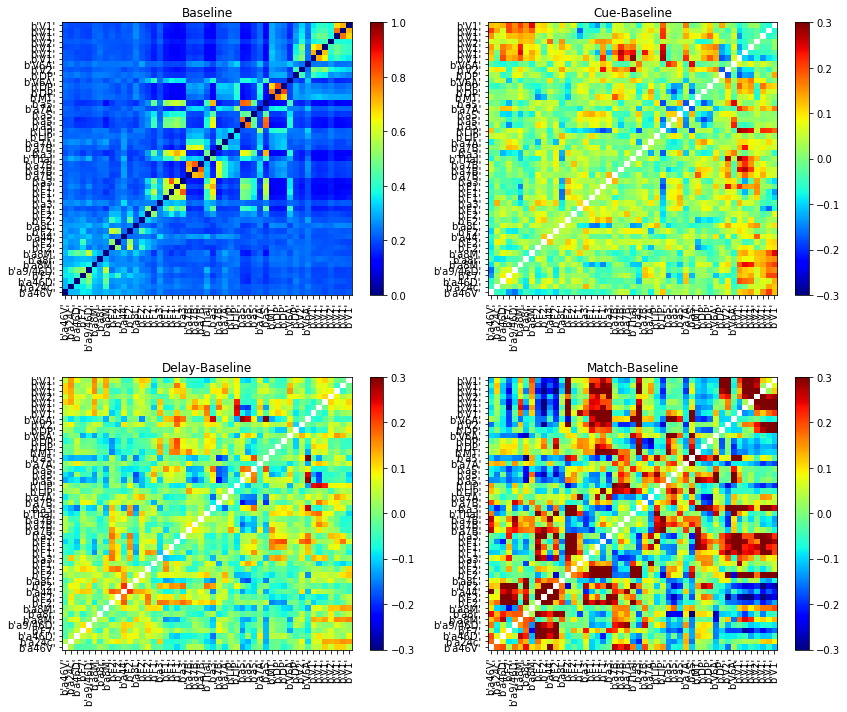

In [21]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_theta.png')

### Allegiance  matrix (alpha band)

In [22]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,1,t_idx], thr=net.coh_thr[1]) )

100%|██████████| 28230/28230 [00:13<00:00, 2136.47it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


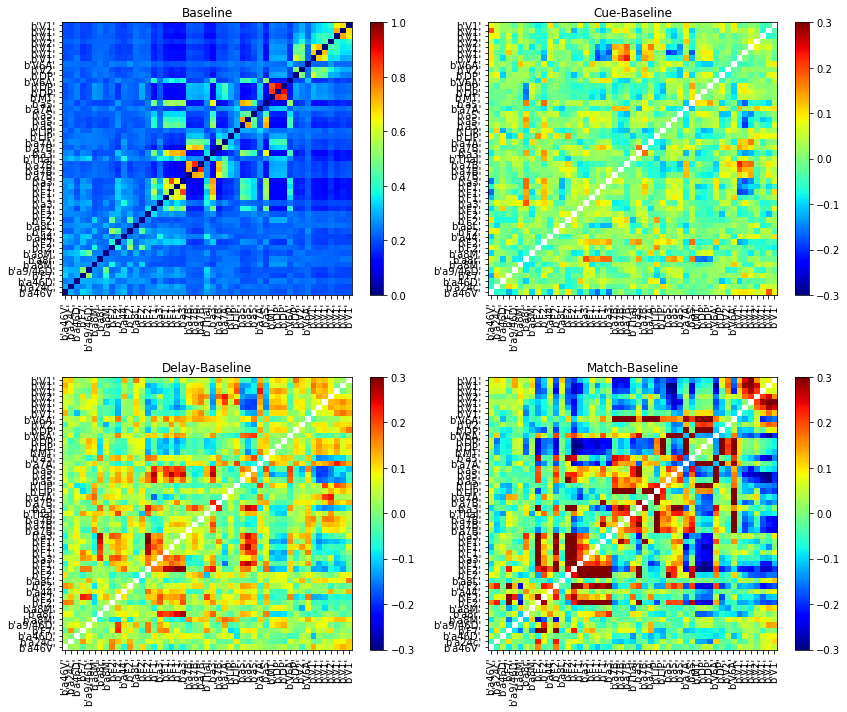

In [23]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_alpha.png')

### Allegiance  matrix (beta band)

In [24]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,2,t_idx], thr=net.coh_thr[2]) )

100%|██████████| 28230/28230 [00:12<00:00, 2256.70it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


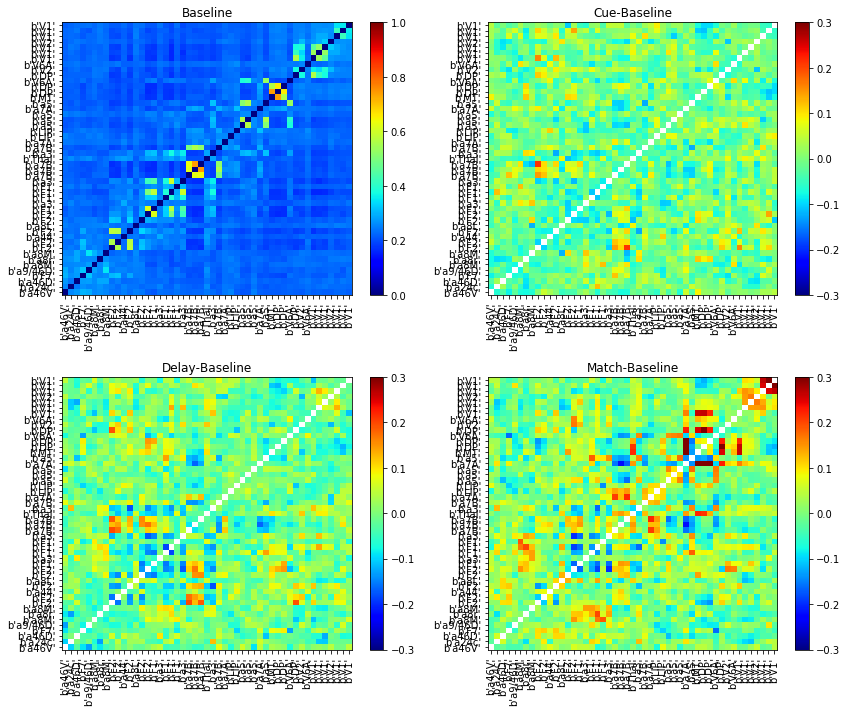

In [25]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_beta.png')

### Allegiance  matrix (low-gamma band)

In [26]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,3,t_idx], thr=net.coh_thr[3]) )

100%|██████████| 28230/28230 [00:12<00:00, 2244.80it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


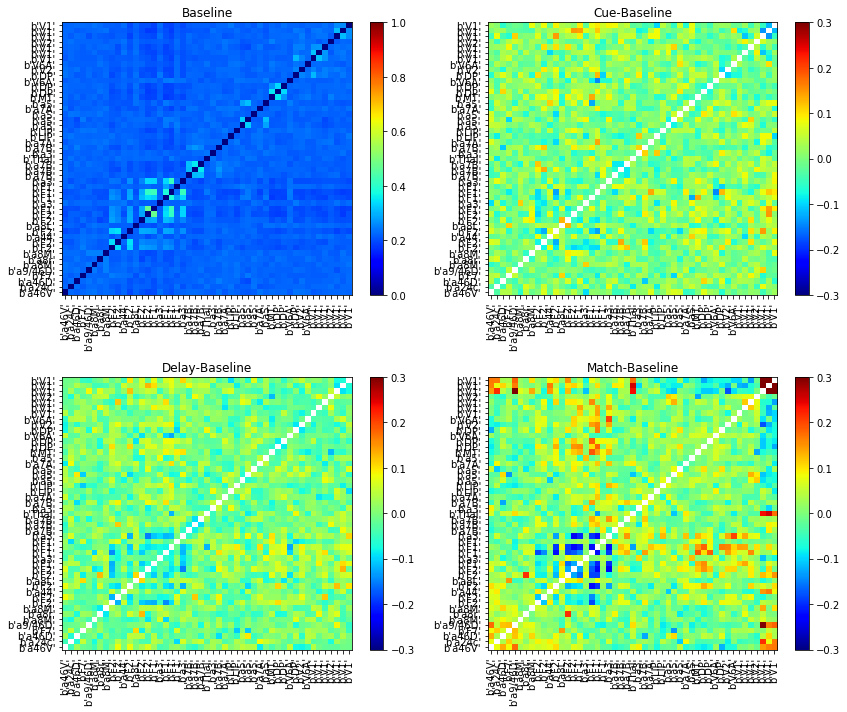

In [27]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_gamma.png')

### Allegiance  matrix (high-gamma band)

In [28]:
T = []
for i in range(4):
    if i == 0: t_idx = net.t_baseline
    if i == 1: t_idx = net.t_cue
    if i == 2: t_idx = net.t_delay
    if i == 3: t_idx = net.t_match
    T.append( compute_allegiance_matrix(net.A[:,:,4,t_idx], thr=net.coh_thr[3]) )

100%|██████████| 28230/28230 [00:12<00:00, 2235.26it/s]


/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


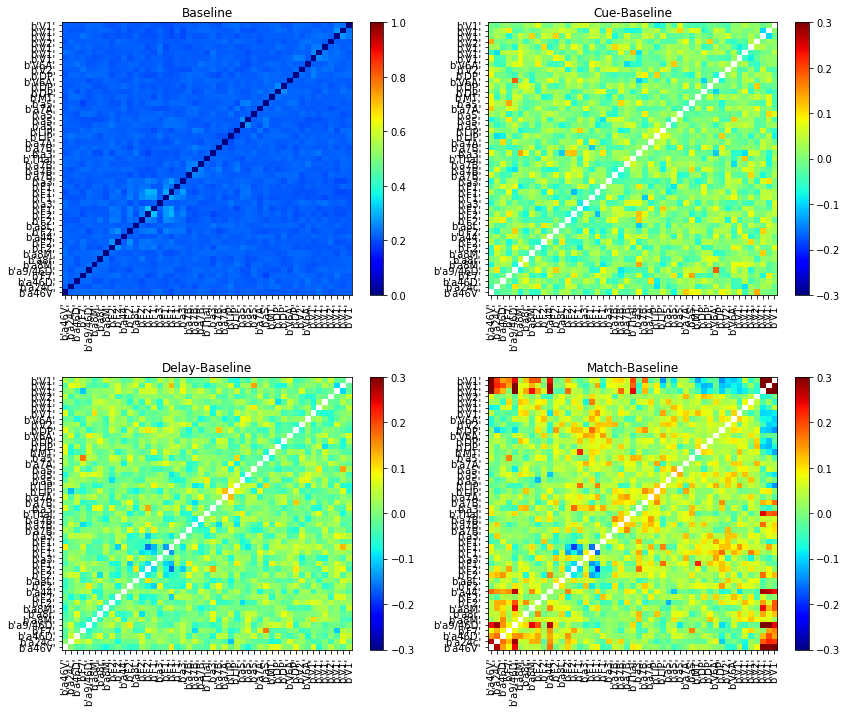

In [29]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[k]-T[0])/T[0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[k], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_high_gamma.png')

### Plotting on the brain surface

Plotting some of the quantities we measured above in the brain surface.

In [45]:
from GDa.graphics.plot_brain_sketch import plot_node_brain_sketch, plot_edge_brain_sketch

#### Plotting average strength 

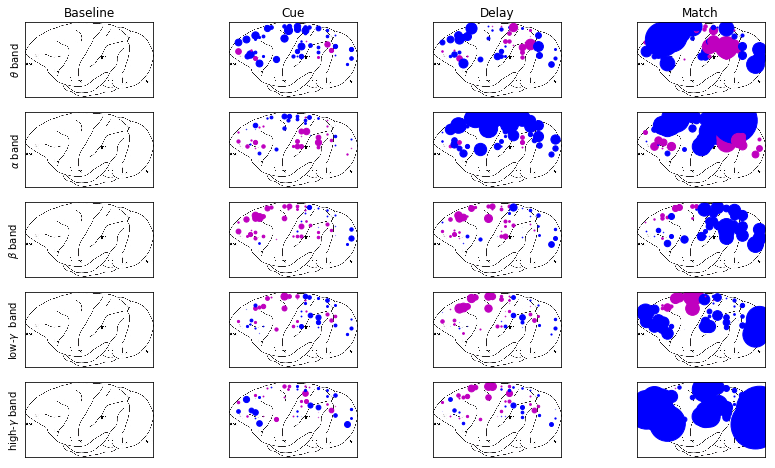

In [46]:
count = 1
alpha = 50
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    # Baseline
    st_b   = Q['degree'][str(i)][:,net.t_baseline].mean(axis=1)
    sst_b  = Q['degree'][str(i)][:,net.t_baseline].std(axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_b-st_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c = Q['degree'][str(i)][:,net.t_cue].mean(axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d = Q['degree'][str(i)][:,net.t_delay].mean(axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m = Q['degree'][str(i)][:,net.t_match].mean(axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/st_brain_map.png')

#### Plotting average coreness 

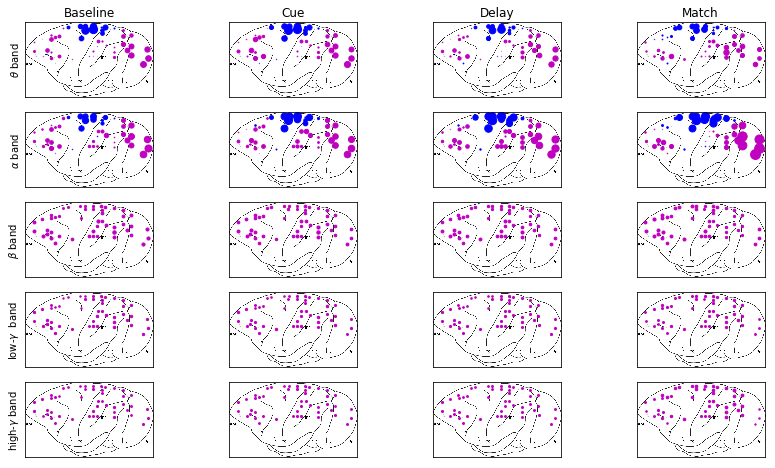

In [47]:
count = 1
alpha = 100
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    # Baseline
    st_b   = Q['coreness'][str(i)][:,net.t_baseline].mean(axis=1)
    sst_b  = Qr['coreness'][str(i)][:,net.t_baseline].mean(axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = Q['coreness'][str(i)][:,net.t_cue].mean(axis=1)
    sst_c = Qr['coreness'][str(i)][:,net.t_cue].mean(axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    #st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = Q['coreness'][str(i)][:,net.t_delay].mean(axis=1)
    sst_d = Qr['coreness'][str(i)][:,net.t_delay].mean(axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    #st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = Q['coreness'][str(i)][:,net.t_match].mean(axis=1)
    sst_m = Qr['coreness'][str(i)][:,net.t_match].mean(axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    #st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map.png')

#### Plotting average coreness (95% percentile)

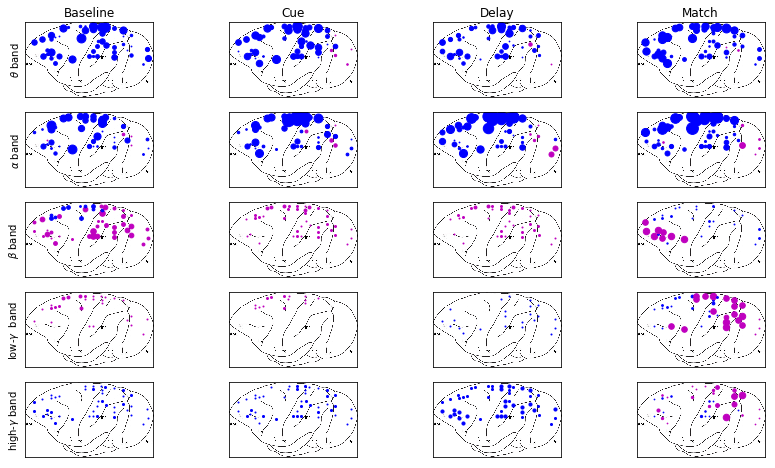

In [48]:
count = 1
alpha = 80
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    # Baseline
    st_b   = np.percentile(Q['coreness'][str(i)][:,net.t_baseline], 95, axis=1)
    sst_b  = np.percentile(Qr['coreness'][str(i)][:,net.t_baseline], 95, axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = np.percentile(Q['coreness'][str(i)][:,net.t_cue], 95, axis=1)
    sst_c = np.percentile(Qr['coreness'][str(i)][:,net.t_cue], 95, axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = np.percentile(Q['coreness'][str(i)][:,net.t_delay], 95, axis=1)
    sst_d = np.percentile(Qr['coreness'][str(i)][:,net.t_delay], 95, axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = np.percentile(Q['coreness'][str(i)][:,net.t_match], 95, axis=1)
    sst_m = np.percentile(Qr['coreness'][str(i)][:,net.t_match], 95, axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map95.png')

#### Plotting average clustering

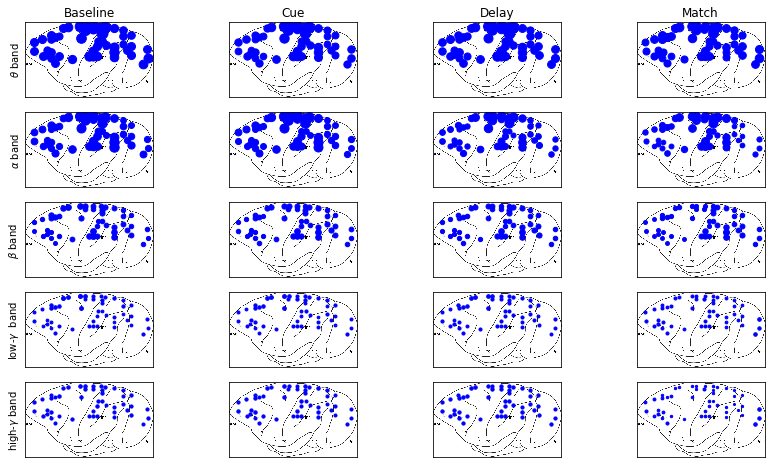

In [51]:
count = 1
alpha = 10
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    # Baseline
    st_b   = Q['clustering'][str(i)][:,net.t_baseline].mean(axis=1)
    sst_b  = Qr['clustering'][str(i)][:,net.t_baseline].mean(axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = Q['clustering'][str(i)][:,net.t_cue].mean(axis=1)
    sst_c = Qr['clustering'][str(i)][:,net.t_cue].mean(axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    #st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = Q['clustering'][str(i)][:,net.t_delay].mean(axis=1)
    sst_d = Qr['clustering'][str(i)][:,net.t_delay].mean(axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    #st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = Q['clustering'][str(i)][:,net.t_match].mean(axis=1)
    sst_m = Qr['clustering'][str(i)][:,net.t_match].mean(axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    #st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/clustering_brain_map.png')

#### Plotting network edges on brain surface

In [ ]:
# Plot edges on brain surface for each time frame
for i in tqdm( range(net.tarray.shape[0]) ):
    if net.tarray[i] < 0:
        color = 'r'
        title = 'Baseline'
    if net.tarray[i] >= 0 and net.tarray[i] < (net.session_info['t_cue_off'][0]-net.session_info['t_cue_on'][0])/1000:
        color = 'b'
        title = 'Cue'
    if net.tarray[i] >= (net.session_info['t_cue_off'][0]-net.session_info['t_cue_on'][0])/1000 and net.tarray[i] < (net.session_info['t_match_on'][0]-net.session_info['t_cue_on'][0])/1000:
        color = 'm'
        title = 'Delay'
    if net.tarray[i] >= (net.session_info['t_match_on'][0]-net.session_info['t_cue_on'][0])/1000:
        color = 'k'
        title = 'Match'
    w = net.super_tensor[:,1,i]>net.coh_thr[1]
    plot_edge_brain_sketch(net.session_info['pairs'], net.session_info['channels_labels'].astype(int), w, edge_color = color)
    plt.title(title)
    plt.savefig('figures/net_'+str(i)+'.png')
    plt.close()

### Finding temporal communities

Using teneto to find the temporal communities (testing)

In [ ]:
from teneto import TemporalNetwork
from teneto import communitydetection

In [ ]:
A    = net.A[:,:,1,:204] + np.transpose(net.A[:,:,1,:204], (1,0,2))
A    = A > net.coh_thr[1]
tnet = TemporalNetwork(from_array = A, nettype = 'bu')

In [ ]:
out = communitydetection.temporal_louvain(tnet, resolution=1, intersliceweight=1, n_iter=100, 
                                          negativeedge='ignore', randomseed=None, 
                                          consensus_threshold=0.5, temporal_consensus=True, 
                                          njobs=40)

In [ ]:
plt.figure(figsize=(8,6))
plt.imshow(out, aspect = 'auto', cmap = 'jet', origin = 'lower', extent = [net.tarray[0],net.tarray[-1],0,48])
plt.colorbar()
plt.title(r'$\omega = 1$, and $\Gamma = 1$')
plt.yticks(net.session_info['areas'], net.session_info['areas'])
plt.xlabel('Time [ms]')

### Comparing with the intervealed fixation task

In [42]:
Q_drt  = np.load('../network_statistics/tt_1_br_1.npy',    allow_pickle=True).item()
Q_drt0 = np.load('../network_statistics/tt_1_br_0.npy',    allow_pickle=True).item() 
Q_fix  = np.load('../network_statistics/tt_2_br_None.npy', allow_pickle=True).item()

### Strength

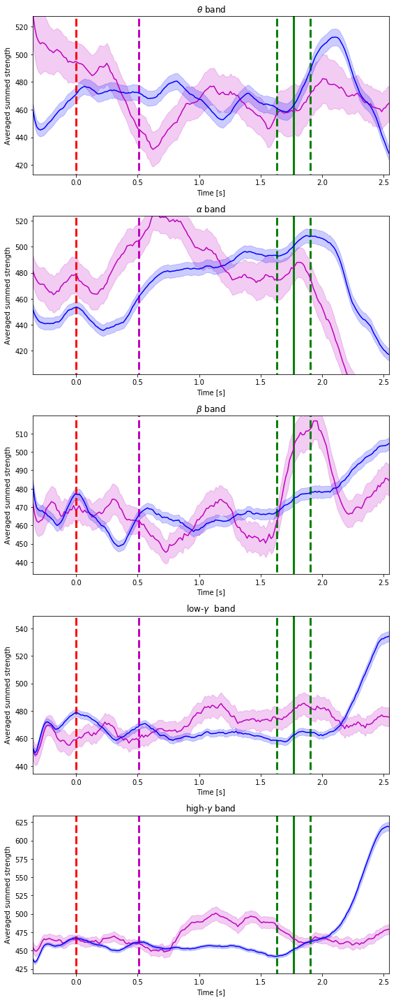

In [43]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_fix['original']['degree'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(76,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['degree'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-15, s_d_m.max()+15])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/strength_fix_drt.png')

### Coreness

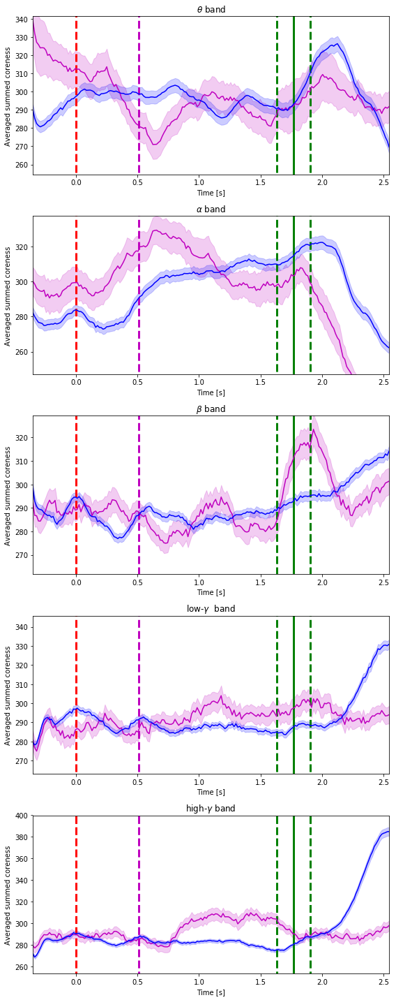

In [44]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_fix['original']['coreness'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(76,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['coreness'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-15, s_d_m.max()+15])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/coreness_fix_drt.png')

### Clustering

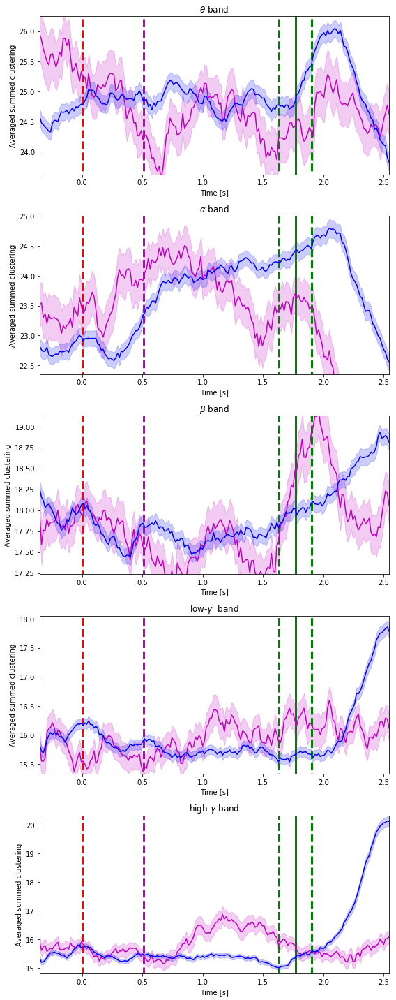

In [45]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_fix['original']['clustering'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(76,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['clustering'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.2, s_d_m.max()+.2])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/clustering_fix_drt.png')

### Modularity

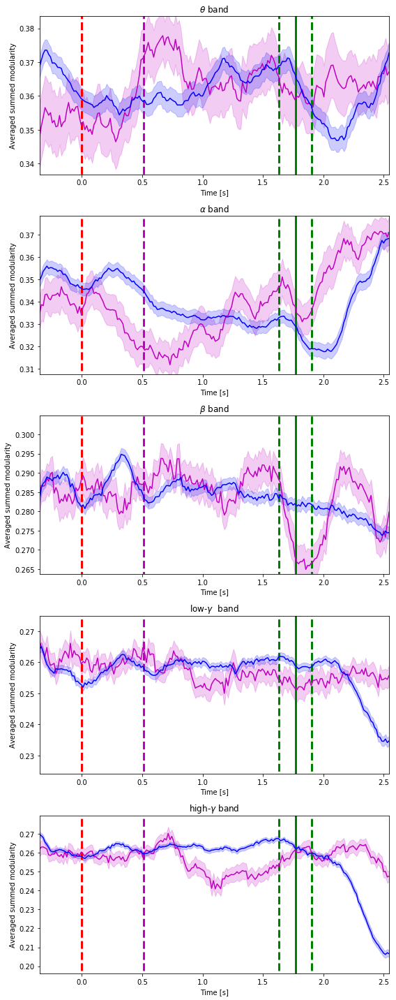

In [46]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_fix['original']['modularity'][str(j)]
    s_d   = s_d.reshape(76,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['modularity'][str(j)]
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.01, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed modularity')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/modularity_fix_drt.png')

### Comparing  DRT for differente behavioral responses

### Strength

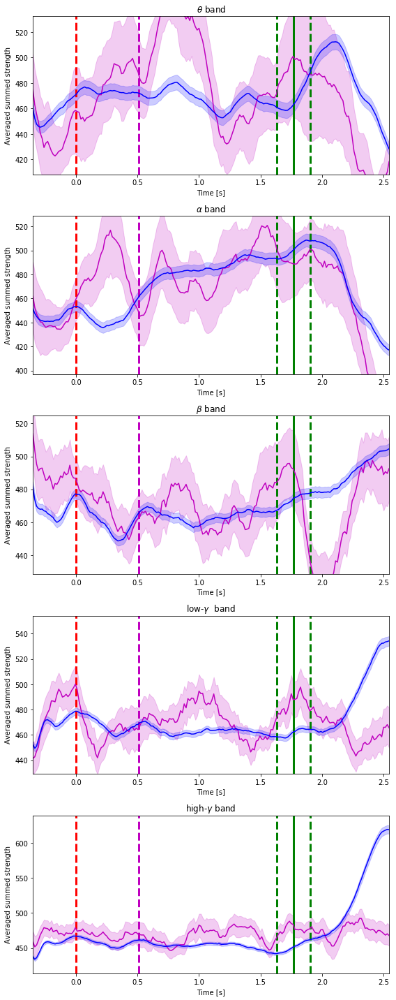

In [34]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_drt0['original']['degree'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(16,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['degree'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-20, s_d_m.max()+20])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/strength_drt_0_1.png')

### Coreness 

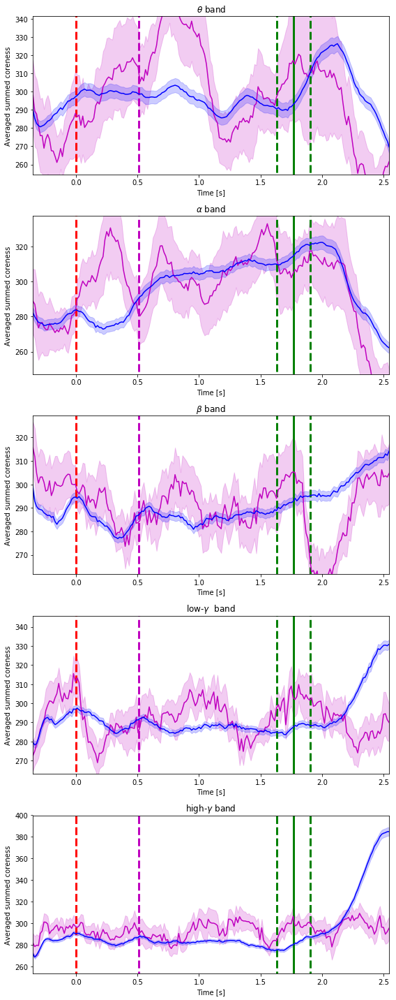

In [35]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_drt0['original']['coreness'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(16,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['coreness'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-15, s_d_m.max()+15])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/coreness_drt_0_1.png')

### Clustering

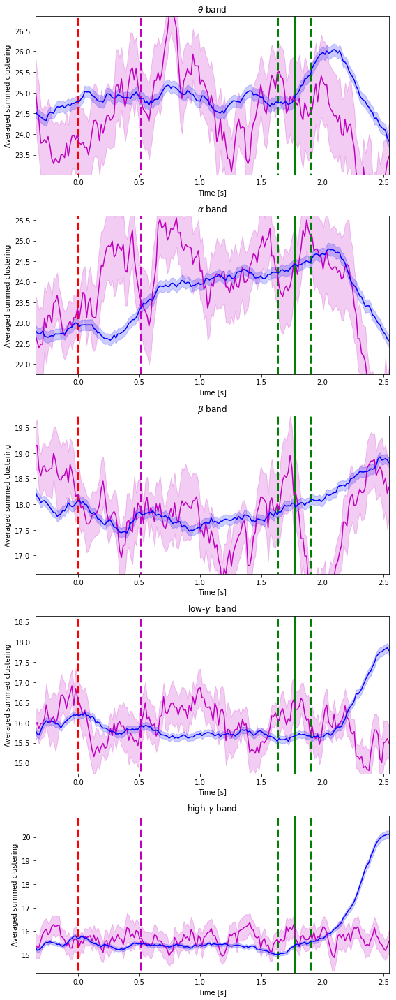

In [36]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_drt0['original']['clustering'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(16,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['clustering'][str(j)].sum(axis=0)
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.8, s_d_m.max()+.8])
    plt.vlines(0, s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-20, s_d_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/clustering_drt_0_1.png')

### Modularity

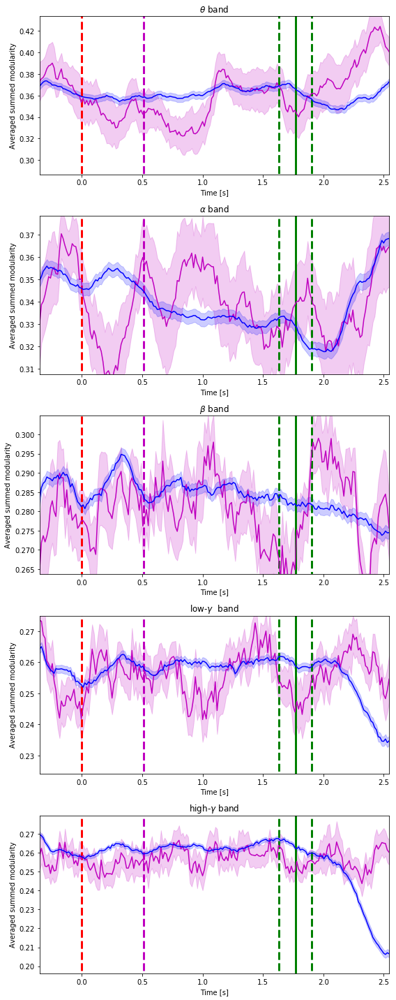

In [37]:
plt.figure(figsize=(8,20))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # FIXATION
    s_d   = Q_drt0['original']['modularity'][str(j)]
    s_d   = s_d.reshape(16,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'm')   
    # DRT
    s_d   = Q_drt['original']['modularity'][str(j)]
    s_d   = s_d.reshape(540,len(net.tarray))
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    # 
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    if j < 1: plt.ylim([s_d_m.min()-.06, s_d_m.max()+.06])
    else: plt.ylim([s_d_m.min()-.01, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed modularity')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/modularity_drt_0_1.png')

### Comparing excess DRT x FIXATION

In [67]:
net_dtr =  temporal_network(raw_path = '../super_tensors/', monkey='lucy', session=1, 
                            date=150128, align_to = 'cue', trial_type = 1, behavioral_response = 1, 
                            trim_borders=True, wt_0=20, wt_1=30)
net_fix =  temporal_network(raw_path = '../super_tensors/', monkey='lucy', session=1, 
                            date=150128, align_to = 'cue', trial_type = 2, behavioral_response = None, 
                            trim_borders=True, wt_0=20, wt_1=30)

In [70]:
Q_drt = np.load('../network_statistics/tt_1_br_1.npy', allow_pickle=True).item()
Q_fix = np.load('../network_statistics/tt_2_br_None.npy', allow_pickle=True).item()

#### Coreness

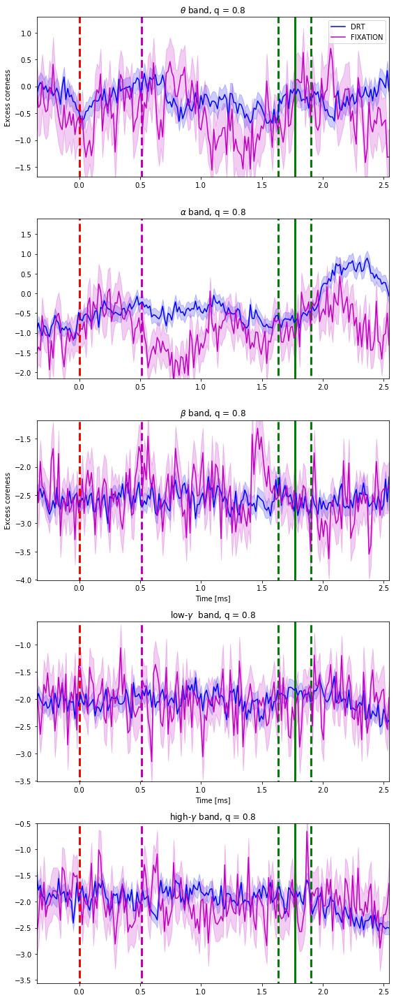

In [71]:
plt.figure(figsize=(8,20))
for i in range(len(net.bands)):
    #DRT
    K_drt_o = net_dtr.reshape_trials( Q_drt['original']['coreness'][str(i)] ).sum(axis = 0)
    K_drt_n = net_dtr.reshape_trials( Q_drt['null']['coreness'][str(i)] ).sum(axis = 0)
    E_drt   = 100*(K_drt_o - K_drt_n)/K_drt_n
    E_drt_m = E_drt.mean(axis = 0)
    E_drt_s = E_drt.std(axis = 0) / np.sqrt(net_dtr.session_info['nT'])
    #FIXATION
    K_fix_o = net_fix.reshape_trials( Q_fix['original']['coreness'][str(i)] ).sum(axis = 0)
    K_fix_n = net_fix.reshape_trials( Q_fix['null']['coreness'][str(i)] ).sum(axis = 0)
    E_fix   = 100*(K_fix_o - K_fix_n)/K_fix_n
    E_fix_m = E_fix.mean(axis = 0)
    E_fix_s = E_fix.std(axis = 0) / np.sqrt(net_fix.session_info['nT'])
    
    plt.subplot(5,1,i+1)
    plt.plot(net_dtr.tarray, E_drt_m, 'b', label = 'DRT')
    plt.fill_between(net_dtr.tarray, E_drt_m-E_drt_s, E_drt_m+E_drt_s, color = 'b', alpha = .2)
    plt.plot(net_dtr.tarray, E_fix_m, 'm', label = 'FIXATION')
    plt.fill_between(net_fix.tarray, E_fix_m-E_fix_s, E_fix_m+E_fix_s, color = 'm', alpha = .2)
    if i == 0: plt.legend()
    if i in [2,3]: plt.xlabel('Time [ms]')
    if i in [0,2]: plt.ylabel('Excess coreness')
    plt.title(bands[i] + ' band, q = 0.8')
    plt.xlim([net_dtr.tarray[0],net_dtr.tarray[-1]])
    plt.ylim([E_drt_m.min()-1, E_drt_m.max()+1])
    plt.vlines(0, E_drt_m.min()-6, E_drt_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net_dtr.session_info['t_cue_off']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()

#### Clustering

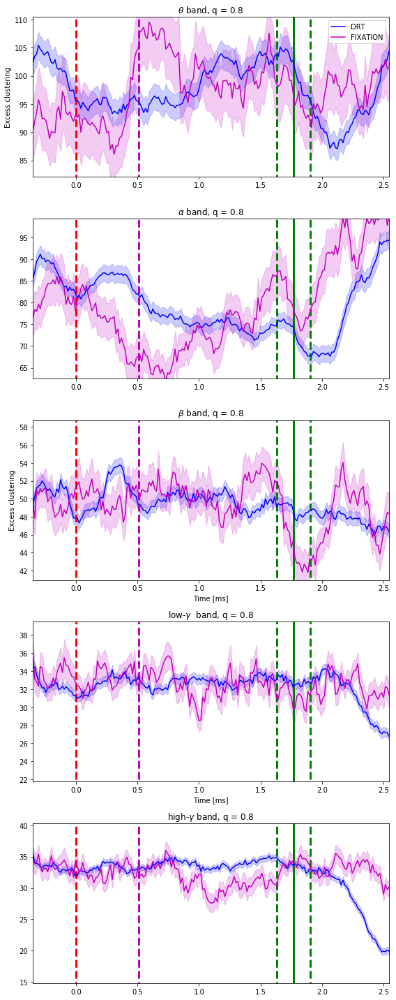

In [72]:
plt.figure(figsize=(8,20))
for i in range(len(net.bands)):
    #DRT
    K_drt_o = net_dtr.reshape_trials( Q_drt['original']['clustering'][str(i)] ).sum(axis = 0)
    K_drt_n = net_dtr.reshape_trials( Q_drt['null']['clustering'][str(i)] ).sum(axis = 0)
    E_drt   = 100*(K_drt_o - K_drt_n)/K_drt_n
    E_drt_m = E_drt.mean(axis = 0)
    E_drt_s = E_drt.std(axis = 0) / np.sqrt(net_dtr.session_info['nT'])
    #FIXATION
    K_fix_o = net_fix.reshape_trials( Q_fix['original']['clustering'][str(i)] ).sum(axis = 0)
    K_fix_n = net_fix.reshape_trials( Q_fix['null']['clustering'][str(i)] ).sum(axis = 0)
    E_fix   = 100*(K_fix_o - K_fix_n)/K_fix_n
    E_fix_m = E_fix.mean(axis = 0)
    E_fix_s = E_fix.std(axis = 0) / np.sqrt(net_fix.session_info['nT'])
    
    plt.subplot(5,1,i+1)
    plt.plot(net_dtr.tarray, E_drt_m, 'b', label = 'DRT')
    plt.fill_between(net_dtr.tarray, E_drt_m-E_drt_s, E_drt_m+E_drt_s, color = 'b', alpha = .2)
    plt.plot(net_dtr.tarray, E_fix_m, 'm', label = 'FIXATION')
    plt.fill_between(net_fix.tarray, E_fix_m-E_fix_s, E_fix_m+E_fix_s, color = 'm', alpha = .2)
    if i == 0: plt.legend()
    if i in [2,3]: plt.xlabel('Time [ms]')
    if i in [0,2]: plt.ylabel('Excess clustering')
    plt.title(bands[i] + ' band, q = 0.8')
    plt.xlim([net_dtr.tarray[0],net_dtr.tarray[-1]])
    plt.ylim([E_drt_m.min()-5, E_drt_m.max()+5])
    plt.vlines(0, E_drt_m.min()-6, E_drt_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net_dtr.session_info['t_cue_off']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-6, E_drt_m.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()

#### Modularity

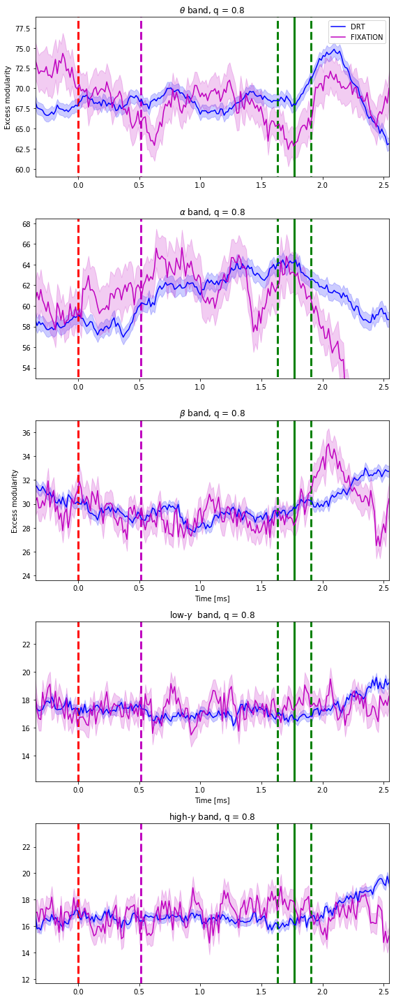

In [74]:
plt.figure(figsize=(8,20))
for i in range(len(net.bands)):
    #DRT
    K_drt_o = net_dtr.reshape_trials( Q_drt['original']['modularity'][str(i)] )
    K_drt_n = net_dtr.reshape_trials( Q_drt['null']['modularity'][str(i)] )
    E_drt   = 100*(K_drt_o - K_drt_n)/K_drt_n
    E_drt_m = E_drt.mean(axis = 0)
    E_drt_s = E_drt.std(axis = 0) / np.sqrt(net_dtr.session_info['nT'])
    #FIXATION
    K_fix_o = net_fix.reshape_trials( Q_fix['original']['modularity'][str(i)] )
    K_fix_n = net_fix.reshape_trials( Q_fix['null']['modularity'][str(i)] )
    E_fix   = 100*(K_fix_o - K_fix_n)/K_fix_n
    E_fix_m = E_fix.mean(axis = 0)
    E_fix_s = E_fix.std(axis = 0) / np.sqrt(net_fix.session_info['nT'])
    
    plt.subplot(5,1,i+1)
    plt.plot(net_dtr.tarray, E_drt_m, 'b', label = 'DRT')
    plt.fill_between(net_dtr.tarray, E_drt_m-E_drt_s, E_drt_m+E_drt_s, color = 'b', alpha = .2)
    plt.plot(net_dtr.tarray, E_fix_m, 'm', label = 'FIXATION')
    plt.fill_between(net_fix.tarray, E_fix_m-E_fix_s, E_fix_m+E_fix_s, color = 'm', alpha = .2)
    if i == 0: plt.legend()
    if i in [2,3]: plt.xlabel('Time [ms]')
    if i in [0,2]: plt.ylabel('Excess modularity')
    plt.title(bands[i] + ' band, q = 0.8')
    plt.xlim([net_dtr.tarray[0],net_dtr.tarray[-1]])
    plt.ylim([E_drt_m.min()-4, E_drt_m.max()+4])
    plt.vlines(0, E_drt_m.min()-20, E_drt_m.max()+20, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net_dtr.session_info['t_cue_off']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-20, E_drt_m.max()+20, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000, 
                       E_drt_m.min()-20, E_drt_m.max()+20, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-20, E_drt_m.max()+20, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net_dtr.session_info['t_match_on']-net_dtr.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       E_drt_m.min()-20, E_drt_m.max()+20, linestyle='--', linewidth = 3, color = 'g')

    plt.tight_layout()